## Лабораторна робота 4 з ІСППР (варіант 22)
### Виконали студенти групи КІ-31мп Шабо О.А. та Сотник Д.C.
##### Датасет: https://www.kaggle.com/datasets/rahulsah06/gooogle-stock-price

# Imports

In [1]:
import torch
import random
import gc
import os
import math

import torch.nn as nn
import torch.optim as optim

import pandas as pd
import numpy as np
import itertools as it
import matplotlib.pyplot as plt
import itertools as it

import torch.optim as optim
import torch.utils.data as data
import sklearn.preprocessing as skp

from tqdm.notebook import tqdm
from copy import deepcopy
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [2]:
if torch.cuda.is_available():
    print("PyTorch GPU is available")
    DEVICE = "cuda"
else:
    print("PyTorch GPU is not available")
    DEVICE = "cpu"
    
BATCH_SIZE = 16
GLOBAL_OPTIMIZER = lambda nn_parameters: optim.Adam(nn_parameters, lr=0.01, weight_decay=1e-4)
GLOBAL_SCHEDULER = lambda optimizer: optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, factor=0.8, min_lr=2e-8, mode="min", verbose=False)
GLOBAL_CRITERION = lambda reduction: nn.MSELoss(reduction=reduction).to(DEVICE)
LAB_FOUR_DIR = "/kaggle/working"
FEATURE_NAMES = ['Open', 'High', 'Low', 'Volume']
TARGET_NAME = 'Close'
ALL_VARIABLE_NAMES = FEATURE_NAMES + [TARGET_NAME]
IN_QUANT = 14
OUT_QUANT = 7

PyTorch GPU is available


## Reproducibility

In [3]:
RANDOM_SEED = 10

# Seed the RNG for all devices (both CPU and CUDA)
torch.manual_seed(RANDOM_SEED)
# Set python seed
random.seed(RANDOM_SEED)
# Set numpy seed
np.random.seed(RANDOM_SEED)

torch.cuda.manual_seed_all(RANDOM_SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

# Worker initialization function for data loaders (simplest approach)
def seed_worker(worker_id):
    worker_seed = (torch.initial_seed() + worker_id) % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

g_train = torch.Generator().manual_seed(RANDOM_SEED)
g_test = torch.Generator().manual_seed(RANDOM_SEED+1)

# EDA

In [4]:
df_train = pd.read_csv('/kaggle/input/Google_Stock_Price_Train.csv')
df_train.tail()

,Date,Open,High,Low,Close,Volume
1253,12/23/2016,790.90,792.74,787.28,789.91,"623,400"
1254,12/27/2016,790.68,797.86,787.66,791.55,"789,100"
1255,12/28/2016,793.70,794.23,783.20,785.05,"1,153,800"
1256,12/29/2016,783.33,785.93,778.92,782.79,"744,300"
1257,12/30/2016,782.75,782.78,770.41,771.82,"1,770,000"


In [5]:
df_test = pd.read_csv('/kaggle/input/Google_Stock_Price_Test.csv')
df_test.head()

,Date,Open,High,Low,Close,Volume
0,1/3/2017,778.81,789.63,775.80,786.14,"1,657,300"
1,1/4/2017,788.36,791.34,783.16,786.90,"1,073,000"
2,1/5/2017,786.08,794.48,785.02,794.02,"1,335,200"
3,1/6/2017,795.26,807.90,792.20,806.15,"1,640,200"
4,1/9/2017,806.40,809.97,802.83,806.65,"1,272,400"


In [6]:
df_train['Close'] = pd.to_numeric(df_train['Close'].str.replace(',', ''), errors='coerce')
df = pd.concat([df_train, df_test], axis=0)

## Data split and normalization

In [7]:
# Select features and target for modeling
df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')
df['Volume'] = pd.to_numeric(df['Volume'].str.replace(',', ''), errors='coerce')

features = df[['Open', 'High', 'Low', 'Volume']]
target = df['Close'].to_frame()
full_df = df[['Open', 'High', 'Low', 'Volume','Close']]

# Normalize features
feature_scaler = StandardScaler()
target_scaler = deepcopy(feature_scaler)
full_scaler = deepcopy(feature_scaler)
split_index = int(len(df) * 0.75)
feature_scaler.fit(features.head(split_index)) # we have access only to train set
target_scaler.fit(target.head(split_index))
full_scaler.fit(full_df.head(split_index))
full_df_normalized = pd.DataFrame(full_scaler.transform(full_df), columns=full_df.columns)

# Split the data
df_train_norm = full_df_normalized.iloc[:split_index]
df_test_norm = full_df_normalized.iloc[split_index:]
df_train = full_df.iloc[:split_index]
df_test = full_df.iloc[split_index:]

# Reqiured classes for work definition
## Dataset class

In [8]:
class TimeSeriesDataset(data.TensorDataset):
    """ Class that creates dataset for timeseries """
    def __init__(self, data, in_data_size, out_data_size, used_feat=ALL_VARIABLE_NAMES,
                 target_feat=TARGET_NAME, convert_to_2d=False):
        self.in_data_size = in_data_size
        self.out_data_size = out_data_size
        self.used_feat = used_feat
        self.target_feat = target_feat
        self.to_supervised(data, convert_to_2d)
        super(TimeSeriesDataset, self).__init__(self.inputs, self.outputs)


    def to_supervised(self, data, convert_to_2d):
        """
        Transform timeseries to a supervised problem.
        Parameters:
            - data: numpy.ndarray
                The input data of shape (num_records, num_features).
            - in_data_size: int
                The size of the input data window.
            - out_data_size: int
                The size of the output data window.
        """
        self.inputs, self.outputs = [], []
        for i in range(len(data)-self.in_data_size-self.out_data_size+1):
            feature = data[self.used_feat].iloc[i:i+self.in_data_size]
            target = data[self.target_feat].iloc[i+self.in_data_size:i+self.in_data_size+self.out_data_size]
            self.inputs.append(feature.values)
            self.outputs.append(target.values)
        if not convert_to_2d:
            self.inputs = np.transpose(
                torch.tensor(np.array(self.inputs), dtype=torch.float32).view(len(data)-self.in_data_size-self.out_data_size+1,\
                self.in_data_size, len(self.used_feat)), axes=(0, 2, 1)
            )
        else:
            assert self.in_data_size % 7 == 0, "in_data_size must be divisible by 7"
            self.inputs = np.transpose(
                torch.tensor(np.array(self.inputs), dtype=torch.float32).view(len(data)-self.in_data_size-self.out_data_size+1,\
                self.in_data_size // 7, 7, len(self.used_feat)), axes=(0, 3, 1, 2)
            )[:,:,:,np.newaxis,:] # input shape for ConvLSTM2D is 5d tensor batch_size x feature_quant x sequence_len(weeks quantity) x
                                  #                                                    x height=1 x width=7
        if type(self.target_feat)==str:
            self.outputs = torch.tensor(np.array(self.outputs), dtype=torch.float32).view(len(data)-self.in_data_size-self.out_data_size+1,\
                                        self.out_data_size)
        else:
            self.outputs = torch.tensor(np.array(self.outputs), dtype=torch.float32).view(len(data)-self.in_data_size-self.out_data_size+1,\
                                        self.out_data_size, len(self.target_feat))


    def __len__(self):
        assert self.inputs.shape[0] == self.outputs.shape[0]
        return self.inputs.shape[0]


    def __getitem__(self, idx):
        return self.inputs[idx], self.outputs[idx]

train_set_norm = TimeSeriesDataset(df_train_norm, IN_QUANT, OUT_QUANT)
test_set_norm = TimeSeriesDataset(pd.concat((df_train_norm.iloc[-IN_QUANT:],df_test_norm)),
                             IN_QUANT, OUT_QUANT)
test_set = TimeSeriesDataset(pd.concat((df_train.iloc[-IN_QUANT:],df_test)),
                             IN_QUANT, OUT_QUANT)

## Backpropagation training class

In [9]:
class BackpropTraining:
    def __init__(
        self,
        nnetwork,
        scheduler,
        criterion_creator,
        optimizer,
        train_set_norm,
        test_set_norm,
        test_set,
        feature_scaler=feature_scaler,
        target_scaler=target_scaler,
        device=DEVICE,
        checkpoint_dir=None,
        global_verbosity=True
    ):
        """
        Backpropagation training abstraction class.
        
        Parameters
        ----------
        nnetwork :
            CNN architecture model, already created and sent to device
        optimizer :
            Already instantiated optimizer
        criterion_creator :
            Method that returns criterion
        train_set :
            Training dataset of type TimeSeriesDataset
        test_set :
            Test dataset of type TimeSeriesDataset
        device :
            Device where data will be sent to (for example cuda)
        checkpoint_dir : optional
            Path to directory where checkpoint state lies
        global_verbosity : optional
            Defines how many messages should be displayed on a glonal class level
        """
        
        self.optimizer = optimizer
        self.criterion = criterion_creator(reduction="mean")
        self.criterion_vec = criterion_creator(reduction="none")
        self.scheduler = scheduler
        self.train_set_norm = train_set_norm # normalized
        self.test_set_norm = test_set_norm # normalized
        self.test_set = test_set
        self.feature_scaler = feature_scaler,
        self.target_scaler = target_scaler
        self.device = device
        self.nnetwork = nnetwork
        self.global_verbosity = global_verbosity
        self.arr_loaded = False # whether we loaded loss arrays
 
        self.train_loader = data.DataLoader(train_set_norm, batch_size=BATCH_SIZE, shuffle=True, drop_last=True, num_workers=0,
            worker_init_fn=seed_worker, generator=g_train)
        self.test_loader = data.DataLoader(test_set_norm, batch_size=BATCH_SIZE, shuffle=False, drop_last=False, num_workers=0,
            worker_init_fn=seed_worker, generator=g_test)
        
        self.train_batches_num = len(self.train_loader)
        self.test_batches_num = len(self.test_loader)
        
        # Load training model from checkpoint
        if checkpoint_dir is not None:
            if self.global_verbosity:
                print("Loading BackpropTraining model from checkpoint...")
            checkpoint = torch.load(checkpoint_dir)
            self.nnetwork.load_state_dict(checkpoint['nnetwork_param'])
            self.optimizer.load_state_dict(checkpoint['optimizer_state'])
            self.scheduler.load_state_dict(checkpoint['scheduler_state'])
            self.start_epoch = checkpoint['current_epoch'] + 1
            self.best_rmse = checkpoint['best_rmse']
            
            # Load rmse arrays
            self.train_rmse_arr = checkpoint['train_rmse_arr']
            self.val_rmse_arr = checkpoint['val_rmse_arr']
            self.val_rmse_vec_arr = checkpoint['val_rmse_vec_arr']
            self.full_train_rmse_arr = checkpoint['full_train_rmse_arr']
            self.full_val_rmse_arr = checkpoint['full_val_rmse_arr']
            self.full_val_rmse_vec_arr = checkpoint['full_val_rmse_vec_arr']
            self.arr_loaded = True
            
            # Load environment state
            torch.set_rng_state(checkpoint['rng_state'])
            torch.cuda.set_rng_state(checkpoint['cuda_rng_state'])
            np.random.set_state(checkpoint['np_random_state'])
            random.setstate(checkpoint['random_state'])
            if self.global_verbosity:
                print(f"!This checkpoint trained for {self.start_epoch} epochs, "
                      f"current start_epoch={self.start_epoch + 1}!")
        # Create blank training model
        else:
            if self.global_verbosity:
                print("Creating BackpropTraining model from scratch...")
            self.start_epoch = 0
            self.best_rmse= np.inf
        if self.global_verbosity:
            print("Model successfully created!")
        self.checkpoint_directory = f'{type(self.nnetwork).__name__}_checkpoints'
        
    def train_validate_cycle(self, epochs, cycle_epoch=1, cycle_batch=9, verbosity=False):
        """
        Performs training with the use of optimizer and learning rate scheduler.
        
        Parameters
        ----------
        epochs :
            Number of training and validation cycle epochs
        cycle_epoch : optional
            The number that determines after which amount of epochs information will be displayed
        cycle_batch : optional
            The number that determines after which amount of batches in each epoch information will
            be displayed
        verbosity : optional
            Whether messages are displayed
        """    
        # Define flag for info display
        print_ind = False

        # Create required arrays to store rmse
        if not self.arr_loaded:
            self.train_rmse_arr = []
            self.val_rmse_arr = []
            self.val_rmse_vec_arr = []
        self.epochs = epochs
        
        ##### Training for epochs #####
        # Create training and validation loop
        if self.global_verbosity:
            print(f"Training model for {epochs} epochs from {self.start_epoch + 1} to"
                  f" {self.start_epoch + epochs}.")
            global_progress_bar = tqdm(range(self.start_epoch, self.start_epoch + epochs))
        else:
            global_progress_bar = range(self.start_epoch, self.start_epoch + epochs)
            
        for epoch in global_progress_bar:
            output_epoch_flag = (epoch + 1) % cycle_epoch == 0 and self.global_verbosity
            if output_epoch_flag:
                print(f"Current epoch: {epoch + 1}\n-------")
                print_ind = True

            ##### Training #####
            # Set network to train mode
            self.nnetwork.train()

            if not output_epoch_flag:
                progress_bar = enumerate(self.train_loader)
            else:
                progress_bar = tqdm(enumerate(self.train_loader))

            # Add a loop through training batches    
            for batch_num, (tr_inputs, real_tr_outputs) in progress_bar:
                # Send data to cuda (preferably)
                tr_inputs = tr_inputs.to(self.device)
                real_tr_outputs = real_tr_outputs.to(self.device)

                # Zero the parameter gradients
                self.optimizer.zero_grad()

                # Forward, backward pass + optimization
                pred_tr_outputs = self.nnetwork(tr_inputs).to(self.device)
                loss = self.criterion(pred_tr_outputs, real_tr_outputs)
                loss.backward()
                self.optimizer.step()

                # Print out how many samples have been seen
                # Output loss each cycle batches (cycle*batch samples)
                if verbosity and (batch_num + 1) % cycle_batch == 0 and batch_num != 0 and print_ind:
                    print(f"Looked at {batch_num * BATCH_SIZE} samples")
                    print(f"Current train loss for batch: {loss}")

                # Clearing memory
                del tr_inputs
                del real_tr_outputs
                del pred_tr_outputs
            ##### Training end #####

            ##### Validation #####
            # Set network to evaluation mode
            self.nnetwork.eval()
            # Turn on inference mode (no autograd)
            with torch.inference_mode():
                average_rmse_train = self.evaluate_rmse(self.train_loader)
                average_rmse_test, average_rmse_test_vec =\
                    self.evaluate_rmse(self.test_loader, return_rmse_vec=True)  
            ##### Validation end #####
                
                # Modify learning rate based on metric value
                self.scheduler.step(average_rmse_test)
                # Save average (throughout the epoch) rmse
                self.train_rmse_arr.append(average_rmse_train)
                self.val_rmse_arr.append(average_rmse_test)
                self.val_rmse_vec_arr.append(average_rmse_test_vec)
                
                # Check if length of arrays is appropriate
                assert len(self.train_rmse_arr)==len(self.val_rmse_arr)==len(self.val_rmse_vec_arr)
                assert epoch + 1 == len(self.train_rmse_arr)
                
                if output_epoch_flag:
                    # Print out average rmse of this epoch each cycle_epoch
                    print(f"\nAverage train rmse: {self.train_rmse_arr[epoch]:.5f}")
                    print(f"Average validation rmse: {self.val_rmse_arr[epoch]:.5f}")
                    print_ind = False
                  
                last_epoch_flag = epoch == self.start_epoch + epochs - 1
                if last_epoch_flag:
                    self.full_train_rmse_arr = self.train_rmse_arr.copy()
                    self.full_val_rmse_arr = self.val_rmse_arr.copy()
                    self.full_val_rmse_vec_arr = self.val_rmse_vec_arr.copy()
                
                # Save checkpoint in case of better rmse on validation set
                if self.best_rmse > self.val_rmse_arr[epoch]:
                    if output_epoch_flag:
                        print(f'\nSaving {epoch+1} status:\'best\' checkpoint, '
                              f'current average rmse: {self.val_rmse_arr[epoch]:.5f} is '
                              f'better than previous best result: {self.best_rmse:.5f}')
                    self.best_rmse = self.val_rmse_arr[epoch]
                    self.checkpoint(epoch, 'best', verbosity=output_epoch_flag,
                                    save_full_loss_arr_flag=last_epoch_flag)
                else:
                    if output_epoch_flag:
                        print(f'\nSaving {epoch+1} status:\'last\' checkpoint, '
                              f'current average rmse: {self.val_rmse_arr[epoch]:.5f}')
                    self.checkpoint(epoch, 'last', verbosity=output_epoch_flag,
                                    save_full_loss_arr_flag=last_epoch_flag)
                    
            # Garbage collection     
            gc.collect()
            torch.cuda.empty_cache()
        ##### Training for epochs END #####

        temporary_checkpoint = torch.load(f"{LAB_FOUR_DIR}/{type(self.nnetwork).__name__}_checkpoints/epoch_best_cpt")
        temporary_checkpoint['full_train_rmse_arr'] = self.full_train_rmse_arr
        temporary_checkpoint['full_val_rmse_arr'] = self.full_val_rmse_arr
        temporary_checkpoint['full_val_rmse_vec_arr'] = self.full_val_rmse_vec_arr
        torch.save(temporary_checkpoint, f"{LAB_FOUR_DIR}/{type(self.nnetwork).__name__}_checkpoints/epoch_best_cpt")

        self.start_epoch += epochs # Save current epoch to start new training from it
    
    def checkpoint(self, current_epoch, status, verbosity, save_full_loss_arr_flag=True, directory_name=None):
        """ Save current_epoch checkpoint """
        state = {
            'nnetwork_param': self.nnetwork.state_dict(),
            'optimizer_state': self.optimizer.state_dict(),
            'scheduler_state': self.scheduler.state_dict(),
            'current_epoch': current_epoch,
            'best_rmse': self.best_rmse,
            'train_rmse_arr': self.train_rmse_arr,
            'val_rmse_arr': self.val_rmse_arr,
            'val_rmse_vec_arr': self.val_rmse_vec_arr,
            'rng_state': torch.get_rng_state(),
            'cuda_rng_state':torch.cuda.get_rng_state(),
            'np_random_state': np.random.get_state(), 
            'random_state': random.getstate()
        }
        
        if save_full_loss_arr_flag:
            state['full_train_rmse_arr'] = self.full_train_rmse_arr
            state['full_val_rmse_arr'] = self.full_val_rmse_arr
            state['full_val_rmse_vec_arr'] = self.full_val_rmse_vec_arr

        if directory_name is None:
            if not os.path.isdir(self.checkpoint_directory):
                os.mkdir(self.checkpoint_directory)

            torch.save(state, './'+ self.checkpoint_directory +\
                        f'/epoch_{status}_cpt')
        else:
            if not os.path.isdir(directory_name):
                os.mkdir(directory_name)
            torch.save(state, './'+ directory_name + '/grid_search_best_cpt')
            
        if verbosity:
            print(f'Successfully saved epoch {current_epoch + 1} status:{status} checkpoint!\n')
    
    def test_and_plot(self, df_full=df, split_index=split_index, pred_feature=TARGET_NAME):
        """ Perform test by forecasting initial data """
        
        def apply_scaler_to_multidim_numpy(numpy_array, target_scaler):
            scaled_arr = numpy_array.copy()
            for i in range(scaled_arr.shape[1]):
                scaled_arr[:, i] = target_scaler.inverse_transform(scaled_arr[:, i].reshape(-1, 1)).flatten()
            return scaled_arr
        
        self.nnetwork.eval()
        # Turn on inference mode (no autograd)
        with torch.inference_mode():
            pred_train_outputs = apply_scaler_to_multidim_numpy(self.nnetwork(self.train_set_norm.inputs.to(self.device)).cpu().numpy(), self.target_scaler)
            real_train_outputs = apply_scaler_to_multidim_numpy(self.train_set_norm.outputs.cpu().numpy(), self.target_scaler)
            pred_test_outputs = apply_scaler_to_multidim_numpy(self.nnetwork(self.test_set_norm.inputs.to(self.device)).cpu().numpy(), self.target_scaler)
            real_test_outputs = self.test_set.outputs.cpu().numpy()
            
            rmse_train = np.sqrt(self.criterion(torch.tensor(pred_train_outputs).to(self.device), torch.tensor(real_train_outputs).to(self.device)).item())
            rmse_test = np.sqrt(self.criterion(torch.tensor(pred_test_outputs).to(self.device),\
                torch.tensor(real_test_outputs).to(self.device)).item())
            rmse_test_vec = np.sqrt(
                np.mean(
                    self.criterion_vec(torch.tensor(pred_test_outputs).to(self.device),\
                        torch.tensor(real_test_outputs).to(self.device)).cpu().numpy(),
                    axis=0
                )
            )

            ##### PLOT #####
            # Define the x-axis values
            assert self.train_set_norm.in_data_size == self.test_set_norm.in_data_size == self.test_set.in_data_size
            assert self.train_set_norm.out_data_size == self.test_set_norm.out_data_size == self.test_set.out_data_size
            used_steps = self.test_set.in_data_size
            predicted_steps = self.test_set.out_data_size
            # ensure the interval calculation logic is correct
            assert split_index == used_steps + len(self.train_set_norm) + predicted_steps - 1
            assert len(df_full["Date"].values) == split_index + len(self.test_set_norm) +\
                predicted_steps - 1
            # date interval where we make prediction on training set
            x_train = [df_full["Date"].values[used_steps+i:used_steps\
                        +len(self.train_set_norm)+i] for i in range(predicted_steps)]
            # date interval where we make prediction on test set
            x_test = [df_full["Date"].values[split_index+i:split_index+len(self.test_set_norm)+i]\
                      for i in range(predicted_steps)]

            # Define the number of columns and rows for subplots
            num_cols = 2
            num_rows = (predicted_steps + num_cols - 1) // num_cols #  "+ num_cols - 1" adds additional row for spare plots

            # Create subplots with the specified number of rows and columns
            fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

            # Iterate over each predicted step
            for k in range(predicted_steps):
                # Calculate the row and column index for the current subplot
                row = k // num_cols
                col = k % num_cols

                # Get the k-th column from pred_train_outputs, pred_test_outputs, and real_outputs
                pred_train = pred_train_outputs[:, k]
                pred_test = pred_test_outputs[:, k]
                
                # Plot real_outputs from start to end
                axs[row, col].plot(df["Date"].values, full_df[pred_feature].values, label="Real Outputs", color="black")
                # Plot pred_train_outputs starting from x=USED_QUANT+k on the x-axis
                axs[row, col].plot(x_train[k], pred_train, label=f"Predicted Train Outputs for {k+1}-th step", color="red")
                # Plot pred_test_outputs starting from x=pred_train_outputs.shape[0]+k on the x-axis
                axs[row, col].plot(x_test[k], pred_test, label=f"Predicted Test Outputs for {k+1}-th step", color="blue")
                # Plot the train/test separator line
                axs[row, col].axvline(x=df_full["Date"].values[split_index], color='black', linestyle='--')

                if k >= predicted_steps - num_cols:
                    # Set the x-axis ticks
                    axs[row, col].set_xticks(df["Date"].iloc[::100])
                    axs[row, col].set_xticklabels(df["Date"].iloc[::100], rotation=90)

                # Add a legend for each plot
                axs[row, col].legend()
            
            # Hide the last two subplots
            for ax in axs.flat[-num_cols * num_rows + predicted_steps:]:
                ax.axis('off')
            
            # Show the plots
            plt.show()
            ##### PLOT END #####
        
        del pred_train_outputs
        del real_train_outputs           
        del pred_test_outputs
        del real_test_outputs
        gc.collect()
        torch.cuda.empty_cache()
        return rmse_train, rmse_test, rmse_test_vec
    
    def evaluate_rmse(self, dataloader, return_rmse_vec=False):
        """ Evaluate model performance on data from dataloader """
        mse = 0
        mse_vec = np.zeros(self.test_set.out_data_size)
        with torch.inference_mode():
            for inputs, real_outputs in dataloader:
                # Send data to cuda (preferably)
                inputs = inputs.to(self.device)
                real_outputs = real_outputs.to(self.device)
                pred_outputs = self.nnetwork(inputs)
                # Test loss and accuracy calculation
                mse_vec += np.mean(self.criterion_vec(pred_outputs, real_outputs).cpu().numpy(), axis=0)
                mse += self.criterion(pred_outputs, real_outputs).cpu().numpy()

                # Clearing memory
                del inputs
                del real_outputs
                del pred_outputs
        if not return_rmse_vec: 
            return np.sqrt(mse / len(dataloader))
        else:
            return np.sqrt(mse / len(dataloader)), np.sqrt(mse_vec / len(dataloader))
    
    def plot_metrics(self):
        """
        Plot rmse plots for train and validations sets.
        Works with latest epochs, train and val rmse arrays respectively.
        """
        plt.figure(figsize = (15, 5))
        epoch_arr = np.arange(1, len(self.full_train_rmse_arr) + 1)
        plt.plot(epoch_arr, self.full_train_rmse_arr, 'r', label='Average train rmse')
        plt.plot(epoch_arr, self.full_val_rmse_arr,'b', label='Average validation rmse')
        plt.axvline(epoch_arr[np.argmin(self.full_val_rmse_arr)], color='black', linestyle='--')
        plt.title("Average rmse")
        plt.legend()
        plt.xlabel("Epoch number")
        plt.ylabel("RMSE value")
        plt.show()

    @staticmethod
    def find_best_model(used_timesteps_arr, train_data_norm, test_data_norm, train_data, test_data,
                        nnetwork_creator, epochs, used_feat, target_feat, scheduler_creator=GLOBAL_SCHEDULER,
                        criterion=GLOBAL_CRITERION, optimizer_creator=GLOBAL_OPTIMIZER):
        """ Find the best amount of previous steps used for prediction based on the average RMSE on the test set"""
        best_prev_steps_used = None
        best_average_rmse_test = float('inf')

        for in_timesteps in tqdm(used_timesteps_arr):
            nnetwork = nnetwork_creator(in_timesteps)
            train_set_norm = TimeSeriesDataset(train_data_norm, in_timesteps, OUT_QUANT, used_feat, target_feat,\
                                               convert_to_2d=nnetwork.conv_dim == "lstm_conv")
            test_set_norm = TimeSeriesDataset(pd.concat((train_data_norm.iloc[-in_timesteps:], test_data_norm)),
                                              in_timesteps, OUT_QUANT, used_feat, target_feat,\
                                              convert_to_2d=nnetwork.conv_dim == "lstm_conv")
            test_set = TimeSeriesDataset(pd.concat((train_data.iloc[-in_timesteps:], test_data)),
                                         in_timesteps, OUT_QUANT, used_feat, target_feat,\
                                         convert_to_2d=nnetwork.conv_dim == "lstm_conv")

            optimizer = optimizer_creator(nnetwork.parameters())
            scheduler = scheduler_creator(optimizer)

            # Create an instance of the BackpropTraining class
            backprop_training = BackpropTraining(nnetwork, scheduler, criterion, optimizer,
                                                 train_set_norm, test_set_norm, test_set, global_verbosity=False)
            # Train the model
            backprop_training.train_validate_cycle(epochs, cycle_epoch=1, cycle_batch=9, verbosity=False)
            # Check if the current model has a better average RMSE on the test set
            str_end = '_' + "_".join(used_feat)
            if backprop_training.best_rmse < best_average_rmse_test: # If the model is better save it
                best_average_rmse_test = backprop_training.best_rmse
                best_prev_steps_used = in_timesteps
                backprop_training = BackpropTraining(nnetwork, scheduler, criterion, optimizer,
                    train_set_norm, test_set_norm, test_set,
                    checkpoint_dir=f"{LAB_FOUR_DIR}/{type(nnetwork).__name__}_checkpoints/epoch_best_cpt",
                    global_verbosity=False)
                backprop_training.checkpoint(current_epoch=backprop_training.start_epoch,
                        status=None,
                        verbosity=False,
                        directory_name=f"{type(nnetwork).__name__}_GS_checkpoints"+str_end) # Save the best epoch of current model as current best model

            del nnetwork
            del backprop_training
            del optimizer
            del scheduler
            gc.collect()
            torch.cuda.empty_cache()

        return best_average_rmse_test, best_prev_steps_used
    

## Conv-LSTM/GRU Encoder-Decoder class

In [87]:
class TimeDistributed(nn.Module):
    def __init__(self, module, batch_first=True):
        super(TimeDistributed, self).__init__()
        self.module = module
        self.batch_first = batch_first

    def forward(self, x):

        if len(x.size()) <= 2:
            return self.module(x)

        # Squash samples and timesteps into a single axis
        x_reshape = x.contiguous().view(-1, x.size(-1))  # (samples * timesteps, input_size)

        y = self.module(x_reshape)

        # We have to reshape Y
        if self.batch_first:
            y = y.contiguous().view(x.size(0), -1, y.size(-1))  # (samples, timesteps, output_size)
        else:
            y = y.view(-1, x.size(1), y.size(-1))  # (timesteps, samples, output_size)

        return y


def get_modules_output_shape(modules, input_shape):
    """
    Calculates the output shape of a series of modules given an input shape.

    Parameters:
    modules (list): A list of modules.
    input_shape (tuple): The input shape.

    Returns:
    int: The output shape.

    Raises:
    AssertionError: If the output shape is not an integer.
    """

    for module in modules:
        input_shape = (input_shape + 2 * np.array(module.padding) -\
                       np.array(module.dilation) * (np.array(module.kernel_size) - 1) - 1)\
            // np.array(module.stride) + 1
    output_shape = np.prod(input_shape)
    assert output_shape % 1 == 0, "Output shape must be an integer"
    return int(output_shape)


class ConvEncoder1D(nn.Module):
    """
    1D Convolutional Encoder module.

    Args:
        in_channels (int): Number of input channels.
        out_channels (int): Number of output channels.
        kernel_size (int, optional): Size of the convolutional kernel. Defaults to 3.
        conv_layers_quant (int, optional): Total number of convolutional layers. Defaults to 1.
        pool_size (int, optional): Size of the max pooling window. Defaults to 2.
    """

    def __init__(self, in_channels, out_channels, kernel_size=3, conv_layers_quant=1, pool_size=2):
        super(ConvEncoder1D, self).__init__()
        assert conv_layers_quant >= 1, "conv_layers_quant must be greater than 0"

        network_blocks = [
            nn.Conv1d(in_channels, out_channels, kernel_size),
            nn.ReLU(),
            nn.MaxPool1d(pool_size, padding=1)
        ]
        if (delta := conv_layers_quant - 1) > 0:
            network_blocks.extend([
                nn.Conv1d(out_channels, out_channels, kernel_size),
                nn.ReLU(),
                nn.MaxPool1d(pool_size)
            ] * delta)
        network_blocks.append(nn.Flatten())

        self.conv_encoder_1d = nn.Sequential(*network_blocks)
    
    def forward(self, x):
        return self.conv_encoder_1d(x)


class ConvLSTMCell(nn.Module):
    def __init__(self, input_size, hidden_size, kernel_size, bias):
        """
        Initializes a ConvLSTMCell object, same as LSTM, although input transformations and
        recurrent transformations are both convolutional.

        Args:
            input_size (int): The number of channels in the input tensor.
            hidden_size (int): The number of channels in the hidden state tensor.
            kernel_size (int or tuple): The size of the convolutional kernel.
            bias (bool): If True, adds a learnable bias to the convolutional layers.

        Returns:
            None
        """
        super(ConvLSTMCell, self).__init__()

        self.input_size = input_size
        self.hidden_size = hidden_size
        self.bias = bias

        self.conv_ih = nn.Conv2d(in_channels=input_size, out_channels=4 * hidden_size, # because later we split into four chunks
                                 kernel_size=kernel_size, bias=bias, padding="same")
        self.conv_hh = nn.Conv2d(in_channels=hidden_size, out_channels=4 * hidden_size,
                                 kernel_size=kernel_size, bias=bias, padding="same")

    def zero_state(self, batch_size, height, width):
        return (torch.zeros(batch_size, self.hidden_size, height, width, device=self.conv_ih.weight.device),
                torch.zeros(batch_size, self.hidden_size, height, width, device=self.conv_ih.weight.device))
        
    def forward(self, input, hidden):
        hx, cx = hidden
        gates = self.conv_ih(input) + self.conv_hh(hx)
        i_gate, f_gate, c_gate, o_gate = gates.chunk(4, 1)

        i_gate = torch.sigmoid(i_gate)
        f_gate = torch.sigmoid(f_gate)
        c_gate = torch.tanh(c_gate)
        o_gate = torch.sigmoid(o_gate)

        cy = (f_gate * cx) + (i_gate * c_gate)
        hy = o_gate * torch.tanh(cy)

        return hy, cy


class LSTMConv2D(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, kernel_size=(1,3), bias=True):
        """
        Initializes the LSTMConv2D class.

        Args:
            input_size (int): The number of expected features in the input.
            hidden_size (int): The number of features in the hidden state.
            num_layers (int): Number of recurrent layers.
            kernel_size (tuple, optional): Size of the convolutional kernel. Defaults to (1,3).
            bias (bool, optional): If True, adds a learnable bias to the output. Defaults to True.
        """
        super(LSTMConv2D, self).__init__()

        self.input_size = input_size
        self.hidden_size = hidden_size
        self.kernel_size = kernel_size
        self.num_layers = num_layers
        self.bias = bias

        cell_list = []
        for i in range(self.num_layers):
            cur_input_dim = self.input_size if i == 0 else self.hidden_size

            cell_list.append(ConvLSTMCell(input_size=cur_input_dim,
                                          hidden_size=self.hidden_size,
                                          kernel_size=self.kernel_size,
                                          bias=self.bias))

        self.cell_list = nn.ModuleList(cell_list)
        self.init_weights()

    def init_weights(self):
        stdv = 1. / math.sqrt(self.hidden_size)
        for weight in self.parameters():
            weight.data.uniform_(-stdv, stdv)

    def forward(self, input):
        # input shape batch_size x features x seq_len=week_num x height=1 x width=7
        layer_output_list = []
        last_state_list   = []

        seq_len = input.size(2)
        cur_layer_input = input

        for layer_idx in range(self.num_layers):
            h, c = self.cell_list[layer_idx].zero_state(input.size(0), input.size(-2), input.size(-1))
            output_inner = []
            for t in range(seq_len):
                h, c = self.cell_list[layer_idx](input=cur_layer_input[:, :, t, :, :], hidden=[h, c])
                output_inner.append(h)

            layer_output = torch.stack(output_inner, dim=2)
            cur_layer_input = layer_output

            layer_output_list.append(layer_output)
            last_state_list.append([h, c])

        return layer_output_list[-1], last_state_list[-1]


class RNNEncoderDecoder(nn.Module):
    def __init__(
        self,
        used_timesteps_quant,
        input_features_quant=len(ALL_VARIABLE_NAMES),
        rnn_type=nn.LSTM,
        conv_dim="conv1d",
        conv_layers_quant=1,
        conv_out_features_quant=64,
        hidden_dim=50,
        out_seq_length=OUT_QUANT,
        rnn_num_layers=1,
        output_features_quant=1
    ):
        super(RNNEncoderDecoder, self).__init__()

        self.out_seq_length = out_seq_length
        self.output_features_quant = output_features_quant
        self.used_timesteps_quant = used_timesteps_quant
        self.conv_dim = conv_dim

        # Conv encoder
        # input shape is (batch_size, in_features, seq_len)
        if conv_dim == "conv1d":
            self.encoder = ConvEncoder1D(input_features_quant, conv_out_features_quant, conv_layers_quant=conv_layers_quant)
            change_dim_modules = []
            for i in range(conv_layers_quant):
                change_dim_modules.extend([self.encoder.conv_encoder_1d[3 * i], self.encoder.conv_encoder_1d[3 * i + 2]])
            decoder_input_feat = get_modules_output_shape(
                change_dim_modules,
                used_timesteps_quant
            ) * conv_out_features_quant
        # output shape is (batch_size, decoder_input_feat = out_features(out_channels) * new_seq_len)
        elif conv_dim == "lstm_conv":
            assert used_timesteps_quant % 7 == 0, "used_timesteps_quant must be divisible by 7"
            self.encoder = LSTMConv2D(input_features_quant, conv_out_features_quant, num_layers=conv_layers_quant)
            decoder_input_feat = conv_out_features_quant * 7
        else:
            raise ValueError("conv_dim must be 1 or 2")

        # LSTM decoder
        # input shape is (batch_size, out_seq_length, decoder_input_feat)
        self.decoder = rnn_type(decoder_input_feat, hidden_dim, rnn_num_layers, batch_first=True)
        # output shape is (batch_size, out_seq_length, hidden_size)
        
        # Linear layer to map hidden state to output
        # applied time-distributetily across each step in out_seq_length from (batch_size, out_seq_length, hidden_size)
        self.linear = TimeDistributed(nn.Linear(hidden_dim, output_features_quant))
        # output shape is (batch_size, output_features_quant)


    def forward(self, input_seq):
        if self.conv_dim == "conv1d":
            # Pass input sequence through encoder
            encoded_input = self.encoder(input_seq)
        else:
            encoded_input, _ = self.encoder(input_seq)
            encoded_input = torch.flatten(encoded_input[:,:,-1,:,:], start_dim=1)
        # Initialize input for decoder
        encoded_input = encoded_input.unsqueeze(1).repeat(1, self.out_seq_length, 1) # Use the last input step as the initial decoder input
        # Feed through decoder
        self.decoder.flatten_parameters()
        decoder_output, _ = self.decoder(encoded_input)
        return self.linear(decoder_output).squeeze(2) if self.output_features_quant==1 else self.linear(decoder_output)

# Model training
## Predictions using univariate Conv1D-LSTM Encoder-Decoder model

In [16]:
# USED_TIMESTEPS_ARR = [14]
USED_TIMESTEPS_ARR = [7, 14, 21, 28]
nnetwork_creator = lambda used_timesteps_quant: RNNEncoderDecoder(
                used_timesteps_quant,
                input_features_quant=1,
                rnn_type=nn.LSTM, # LSTM
                conv_dim="conv1d",
                conv_layers_quant=1,
                conv_out_features_quant=64,
                hidden_dim=35,
                out_seq_length=OUT_QUANT,
                rnn_num_layers=2,
                output_features_quant=1
        ).to(DEVICE)

dict_best_steps = {}
for used_variable in tqdm(ALL_VARIABLE_NAMES):
    best_average_rmse_test, best_prev_steps_used = BackpropTraining.find_best_model(
            used_timesteps_arr=USED_TIMESTEPS_ARR,
            train_data_norm=df_train_norm,
            test_data_norm=df_test_norm,
            train_data=df_train,
            test_data=df_test,
            nnetwork_creator=nnetwork_creator,
            epochs=75,
            used_feat=[used_variable],
            target_feat=TARGET_NAME
    )

    dict_best_steps[used_variable] = best_prev_steps_used

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

In [17]:
def load_and_plot(nnetwork, optimizer, scheduler, used_variables_arr, dict_best_steps, custom_dir=None):
    in_timesteps = dict_best_steps["_".join(used_variables_arr)]
    train_set_norm = TimeSeriesDataset(df_train_norm, in_timesteps, OUT_QUANT, used_variables_arr,\
                                       TARGET_NAME, convert_to_2d=nnetwork.conv_dim == "lstm_conv")
    test_set_norm = TimeSeriesDataset(pd.concat((df_train_norm.iloc[-in_timesteps:], df_test_norm)),
                                      in_timesteps, OUT_QUANT, used_variables_arr, TARGET_NAME,\
                                      convert_to_2d=nnetwork.conv_dim == "lstm_conv")
    test_set = TimeSeriesDataset(pd.concat((df_train.iloc[-in_timesteps:], df_test)),
                                 in_timesteps, OUT_QUANT, used_variables_arr, TARGET_NAME,\
                                 convert_to_2d=nnetwork.conv_dim == "lstm_conv")
    
    if not custom_dir:
        backprop_training = BackpropTraining(nnetwork, scheduler, GLOBAL_CRITERION, optimizer,
            train_set_norm, test_set_norm, test_set, 
            checkpoint_dir=f"{LAB_FOUR_DIR}/{type(nnetwork).__name__}_GS_checkpoints" +\
                                             '_' + "_".join(used_variables_arr) + "/grid_search_best_cpt",
            global_verbosity=False)
    else:
        backprop_training = BackpropTraining(nnetwork, scheduler, GLOBAL_CRITERION, optimizer,
            train_set_norm, test_set_norm, test_set, checkpoint_dir=custom_dir, global_verbosity=False)

    return backprop_training.test_and_plot(), backprop_training # rmse_train, rmse_test, rmse_test_vec, backprop_training

### Using 'Open' variable for prediction

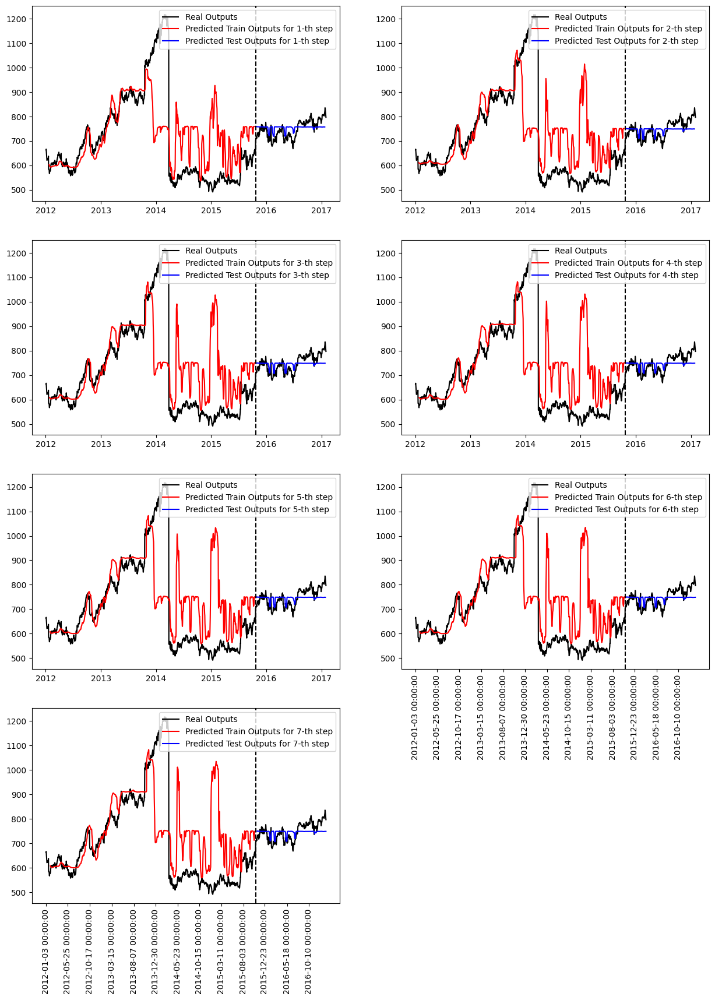

In [18]:
nnetwork = nnetwork_creator(dict_best_steps["Open"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Open"], dict_best_steps)

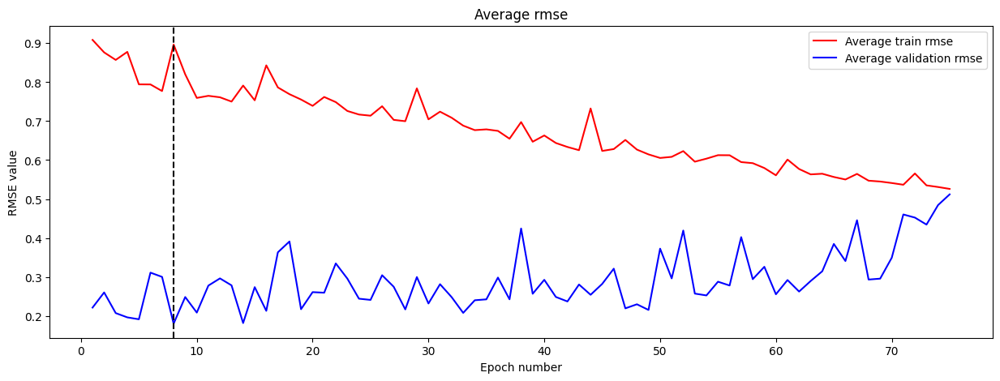

In [19]:
backprop_training.plot_metrics()

In [20]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Open']}")

RMSE on the training set is: 167.5958272992648
RMSE on the testing set is: 32.78971865408519
RMSE for each of the 7 points on the testing set: [32.62753  31.75719  32.226063 32.664845 33.080738 33.42619  33.703526]
Previous steps used: 14


### Using 'Low' variable for prediction

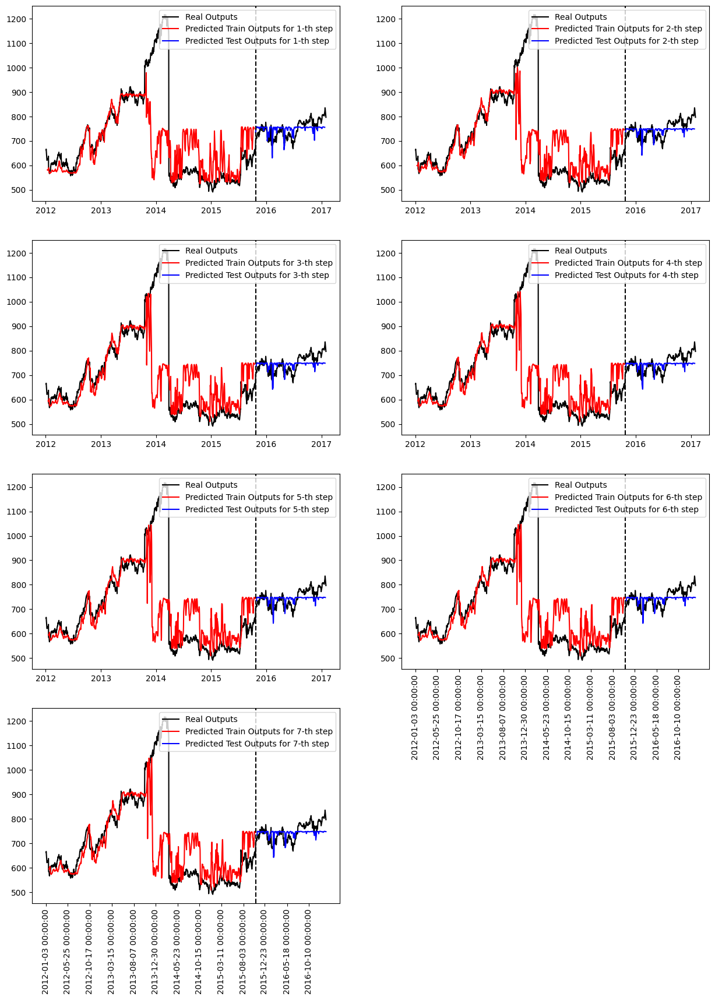

In [22]:
nnetwork = nnetwork_creator(dict_best_steps["Low"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Low"], dict_best_steps)

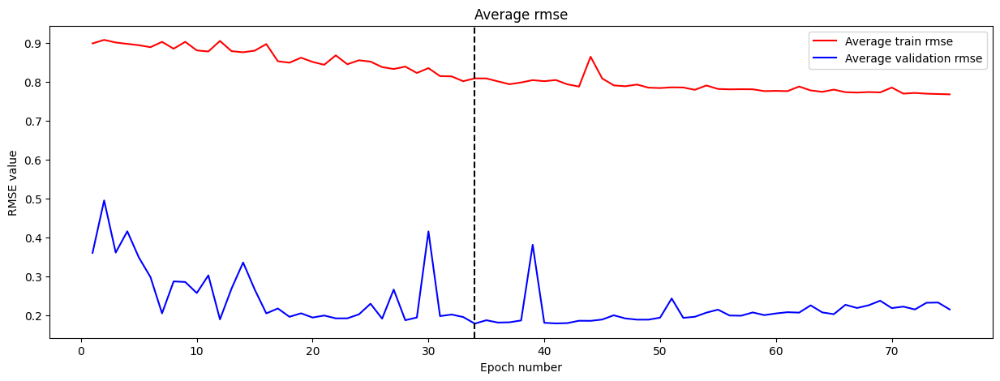

In [23]:
backprop_training.plot_metrics()

In [24]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Low']}")

RMSE on the training set is: 151.0118346976488
RMSE on the testing set is: 32.55521339118072
RMSE for each of the 7 points on the testing set: [31.169207 31.649752 32.038464 32.57441  33.08103  33.455616 33.83016 ]
Previous steps used: 7


### Using 'High' variable for prediction

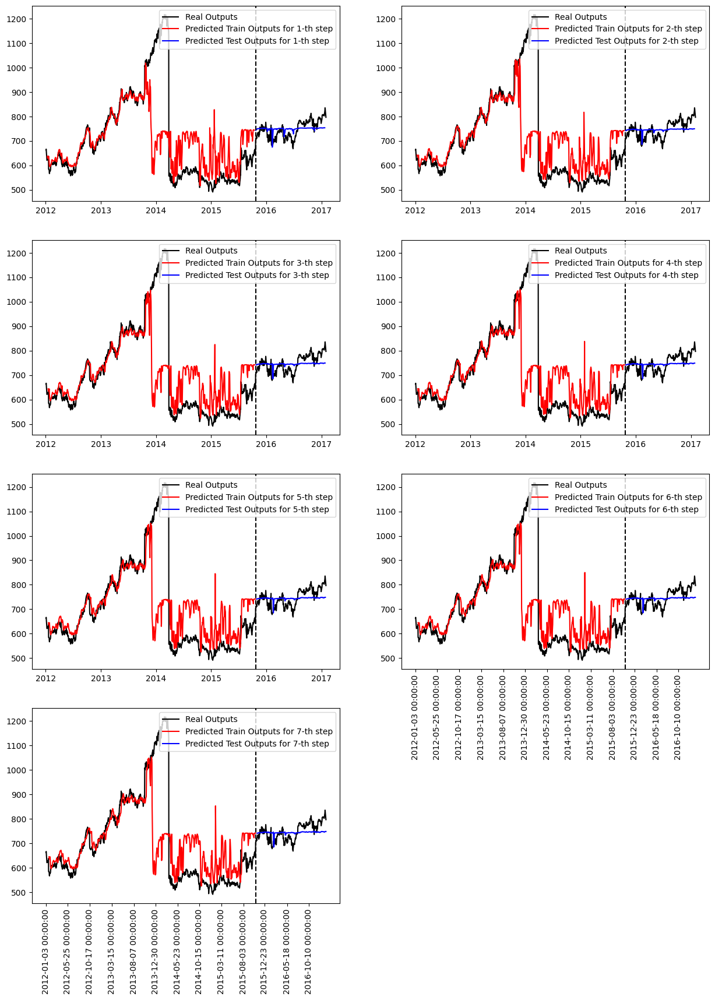

In [25]:
nnetwork = nnetwork_creator(dict_best_steps["High"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(nnetwork, optimizer,
                            scheduler, ["High"], dict_best_steps)

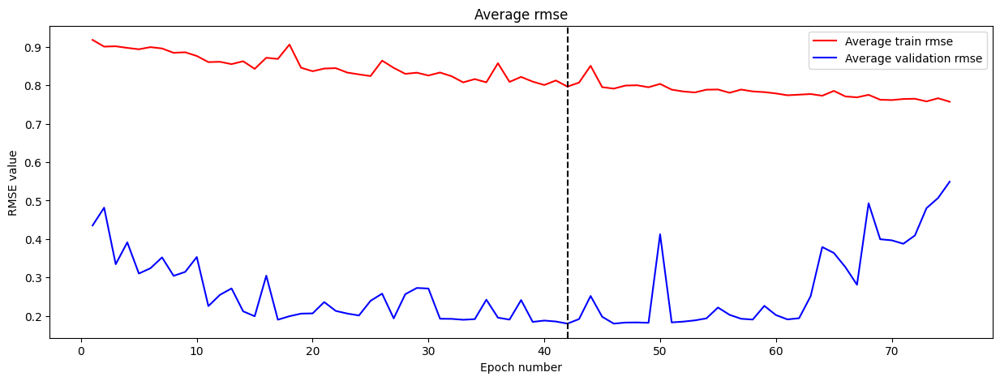

In [28]:
backprop_training.plot_metrics()

In [29]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['High']}")

RMSE on the training set is: 148.74175397311947
RMSE on the testing set is: 32.758299729562815
RMSE for each of the 7 points on the testing set: [31.107874 32.019913 32.509468 32.986454 33.360435 33.54222  33.701584]
Previous steps used: 7


### Using 'Volume' variable for prediction

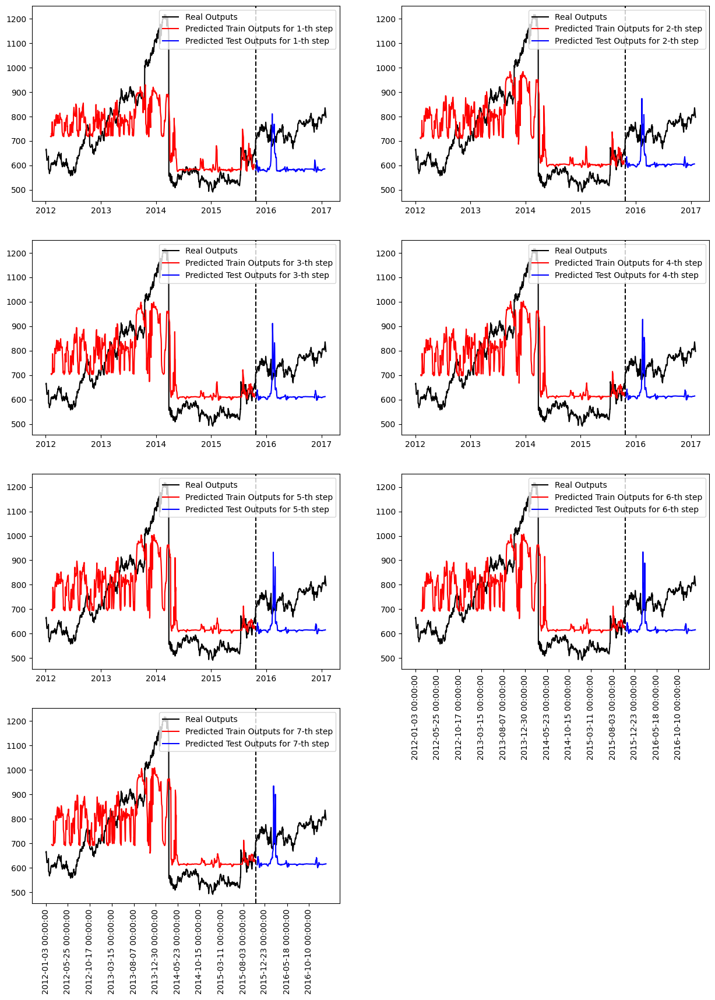

In [30]:
nnetwork = nnetwork_creator(dict_best_steps["Volume"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(nnetwork, optimizer,
                            scheduler, ["Volume"], dict_best_steps)

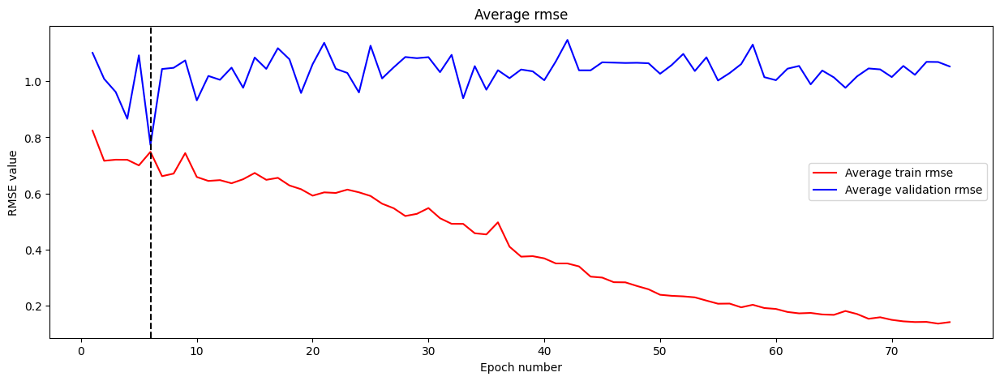

In [31]:
backprop_training.plot_metrics()

In [32]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Volume']}")

RMSE on the training set is: 139.6554283652268
RMSE on the testing set is: 143.08359799650344
RMSE for each of the 7 points on the testing set: [163.51587 145.68735 140.24588 138.27666 137.4195  137.18831 137.31012]
Previous steps used: 21


### Using 'Close' variable for prediction (best result)

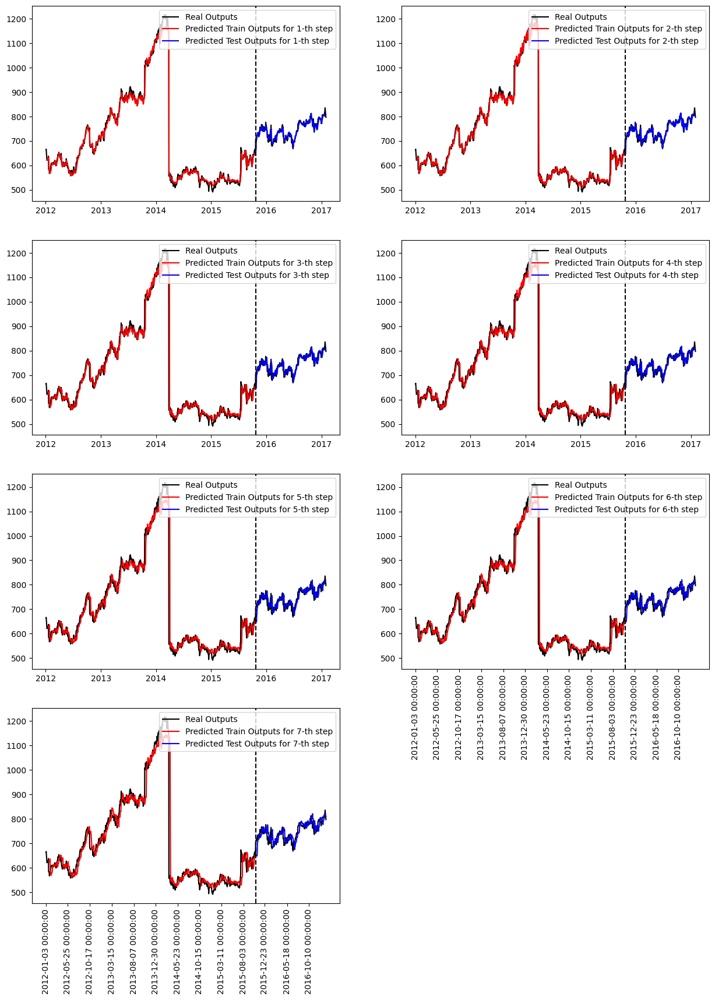

In [33]:
nnetwork = nnetwork_creator(dict_best_steps["Close"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Close"], dict_best_steps)

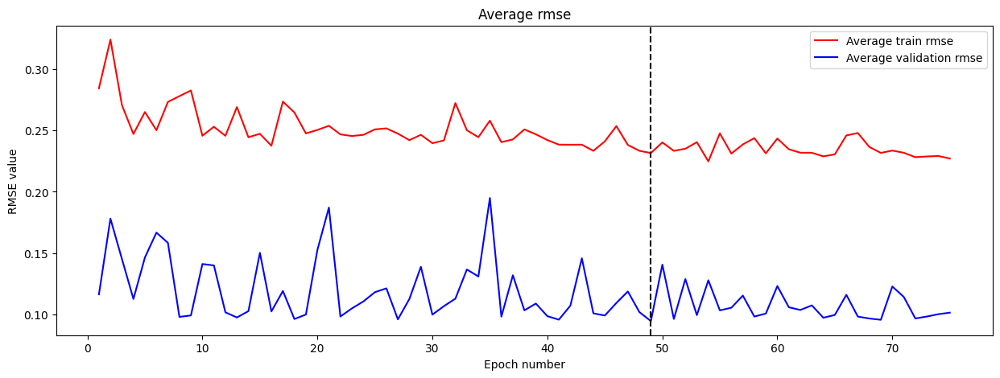

In [34]:
backprop_training.plot_metrics()

In [35]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Close']}")

RMSE on the training set is: 43.24255236408852
RMSE on the testing set is: 17.771340020466855
RMSE for each of the 7 points on the testing set: [10.962803 13.751321 16.203627 18.085758 19.530836 20.860971 22.252556]
Previous steps used: 7


## Predictions using multi-layered univariate Conv1D-LSTM Encoder-Decoder model

In [38]:
USED_TIMESTEPS_ARR = [14, 21, 28, 35] # larger amount of used steps
nnetwork_creator = lambda used_timesteps_quant: RNNEncoderDecoder(
                used_timesteps_quant,
                input_features_quant=1,
                rnn_type=nn.LSTM,
                conv_dim="conv1d",
                conv_layers_quant=2, # several layers
                conv_out_features_quant=64,
                hidden_dim=35,
                out_seq_length=OUT_QUANT,
                rnn_num_layers=2,
                output_features_quant=1
        ).to(DEVICE)

dict_best_steps = {}
for used_variable in tqdm(["Close"]):
    best_average_rmse_test, best_prev_steps_used = BackpropTraining.find_best_model(
            used_timesteps_arr=USED_TIMESTEPS_ARR,
            train_data_norm=df_train_norm,
            test_data_norm=df_test_norm,
            train_data=df_train,
            test_data=df_test,
            nnetwork_creator=nnetwork_creator,
            epochs=75,
            used_feat=[used_variable],
            target_feat=TARGET_NAME
    )

    dict_best_steps[used_variable] = best_prev_steps_used

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

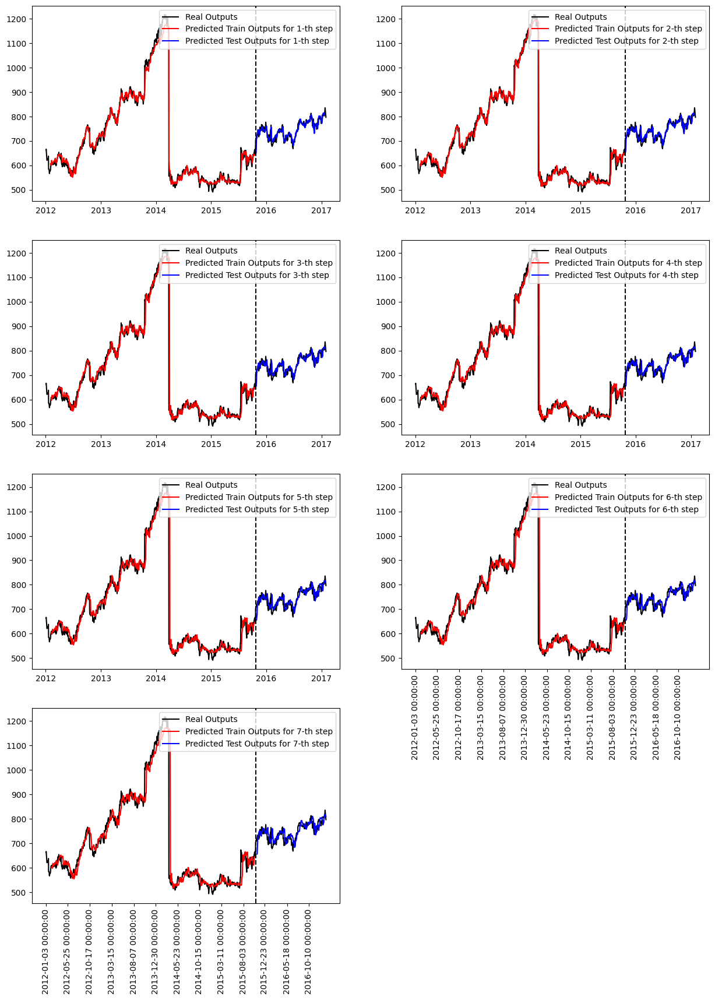

In [39]:
nnetwork = nnetwork_creator(dict_best_steps["Close"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Close"], dict_best_steps)

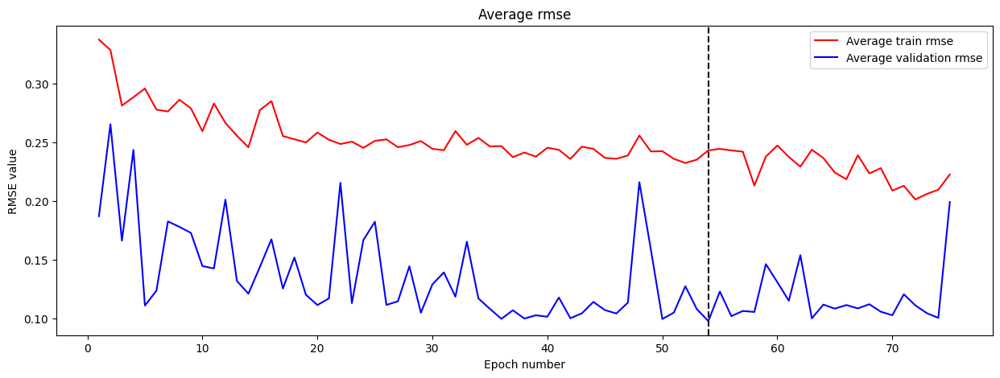

In [40]:
backprop_training.plot_metrics()

In [41]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Close']}")

RMSE on the training set is: 45.35621275146603
RMSE on the testing set is: 18.33639436078688
RMSE for each of the 7 points on the testing set: [13.2153845 15.38207   17.118366  18.575434  19.763634  20.779984
 21.95028  ]
Previous steps used: 21


## Predictions using univariate Conv1D-GRU Encoder-Decoder model

In [42]:
USED_TIMESTEPS_ARR = [7, 14, 21, 28]
nnetwork_creator = lambda used_timesteps_quant: RNNEncoderDecoder(
                used_timesteps_quant,
                input_features_quant=1,
                rnn_type=nn.GRU, # GRU
                conv_dim="conv1d",
                conv_layers_quant=1,
                conv_out_features_quant=64,
                hidden_dim=35,
                out_seq_length=OUT_QUANT,
                rnn_num_layers=2,
                output_features_quant=1
        ).to(DEVICE)

dict_best_steps = {}
for used_variable in tqdm(ALL_VARIABLE_NAMES):
    best_average_rmse_test, best_prev_steps_used = BackpropTraining.find_best_model(
            used_timesteps_arr=USED_TIMESTEPS_ARR,
            train_data_norm=df_train_norm,
            test_data_norm=df_test_norm,
            train_data=df_train,
            test_data=df_test,
            nnetwork_creator=nnetwork_creator,
            epochs=75,
            used_feat=[used_variable],
            target_feat=TARGET_NAME
    )

    dict_best_steps[used_variable] = best_prev_steps_used

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

### Using 'Open' variable for prediction

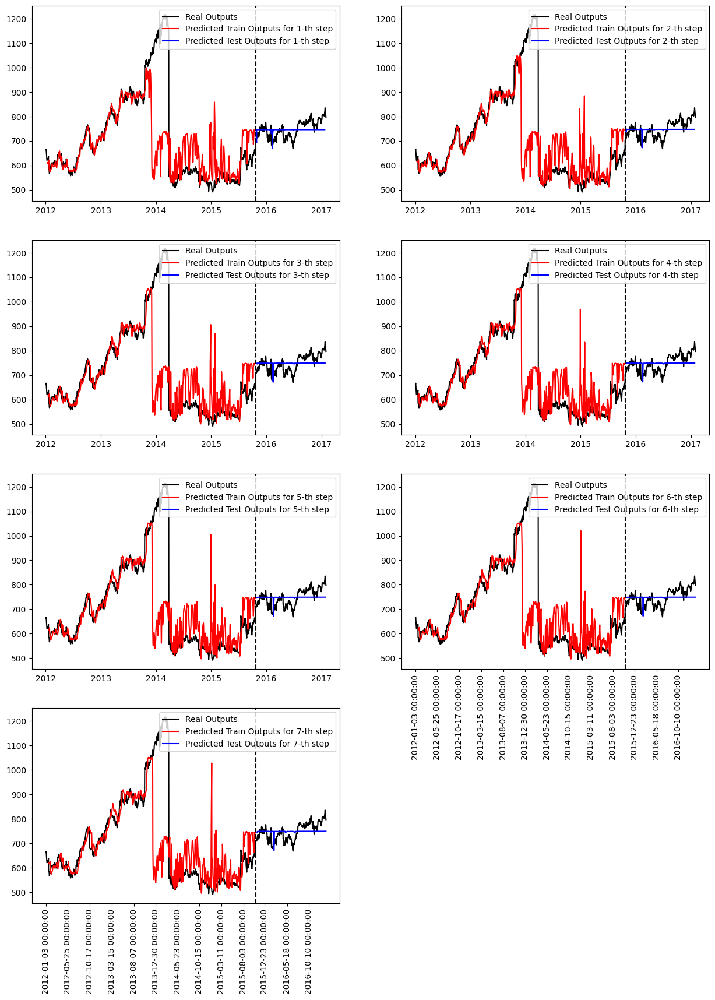

In [43]:
nnetwork = nnetwork_creator(dict_best_steps["Open"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Open"], dict_best_steps)

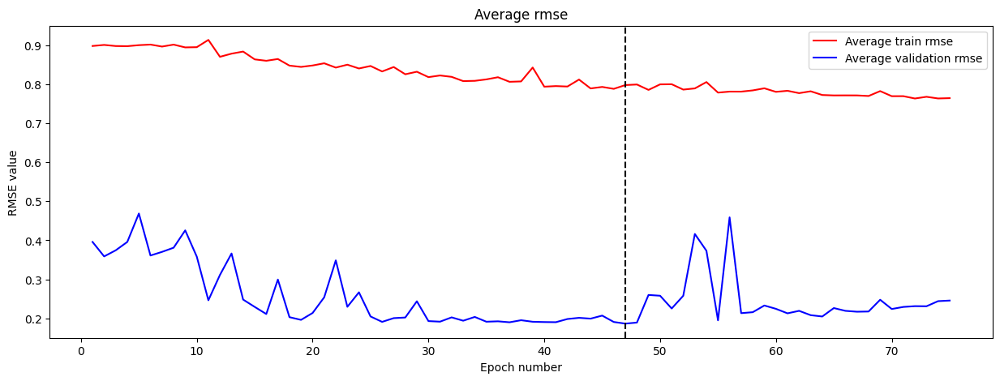

In [44]:
backprop_training.plot_metrics()

In [45]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Open']}")

RMSE on the training set is: 148.93815568466664
RMSE on the testing set is: 34.06720330200753
RMSE for each of the 7 points on the testing set: [33.270878 33.56828  33.91397  34.25392  34.428238 34.48696  34.526768]
Previous steps used: 7


### Using 'Low' variable for prediction

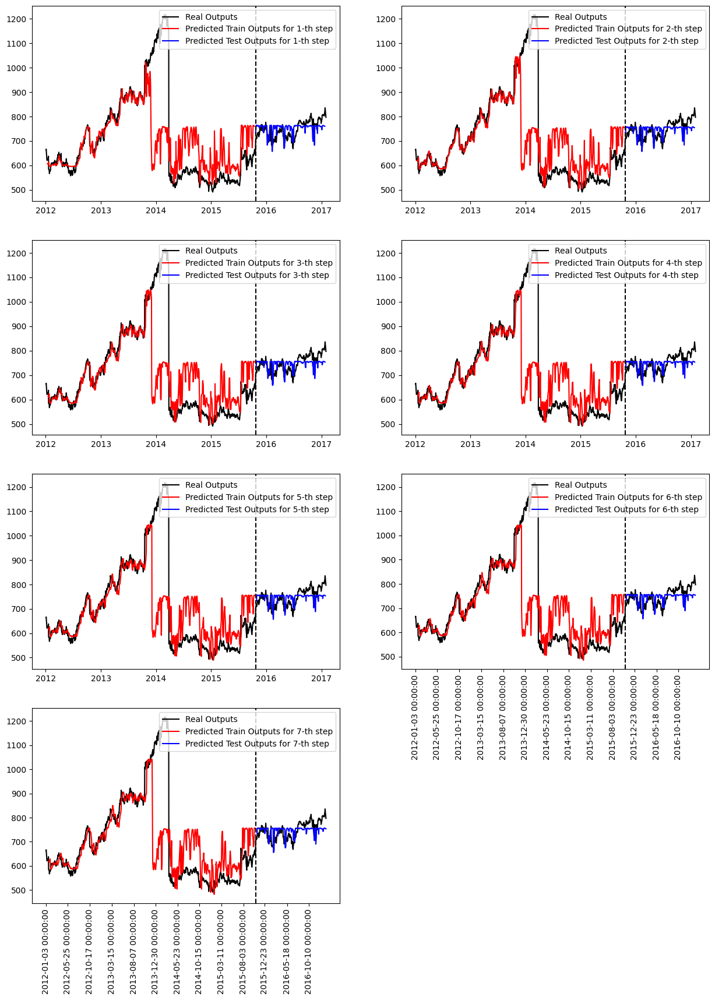

In [46]:
nnetwork = nnetwork_creator(dict_best_steps["Low"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(nnetwork, optimizer,
                                                        scheduler, ["Low"], dict_best_steps)

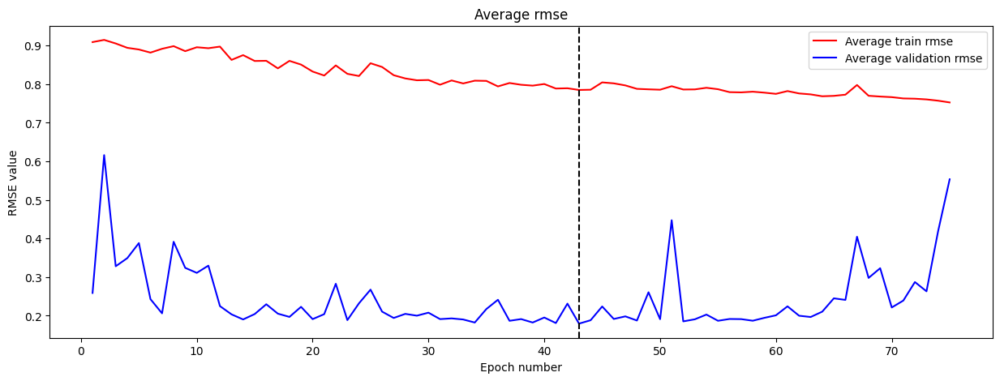

In [47]:
backprop_training.plot_metrics()

In [48]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Low']}")

RMSE on the training set is: 146.5794366546686
RMSE on the testing set is: 32.90472159318477
RMSE for each of the 7 points on the testing set: [32.705486 32.143837 32.384506 32.62261  33.008114 33.438614 33.992664]
Previous steps used: 7


### Using 'High' variable for prediction

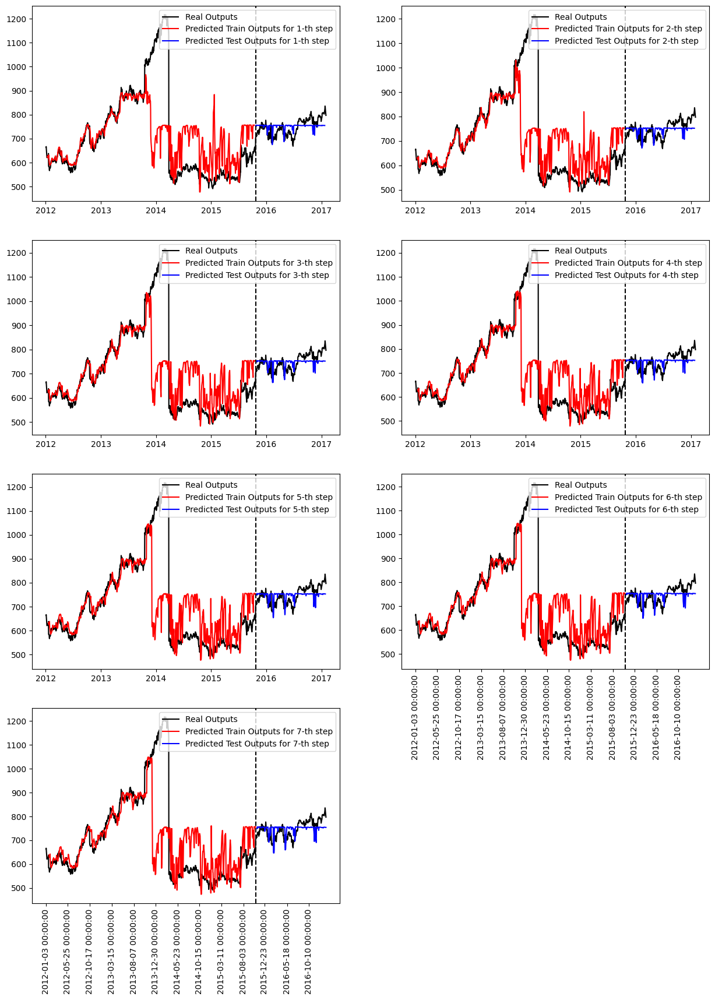

In [49]:
nnetwork = nnetwork_creator(dict_best_steps["High"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(nnetwork, optimizer,
                                                        scheduler, ["High"], dict_best_steps)

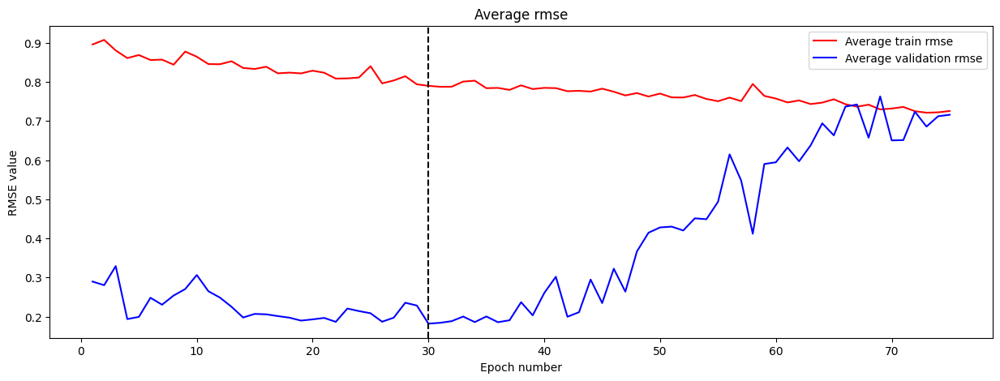

In [50]:
backprop_training.plot_metrics()

In [51]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['High']}")

RMSE on the training set is: 147.51112246200285
RMSE on the testing set is: 33.3072906486187
RMSE for each of the 7 points on the testing set: [32.542934 32.17866  32.73711  33.130043 33.58336  34.1598   34.742905]
Previous steps used: 7


### Using 'Volume' variable for prediction

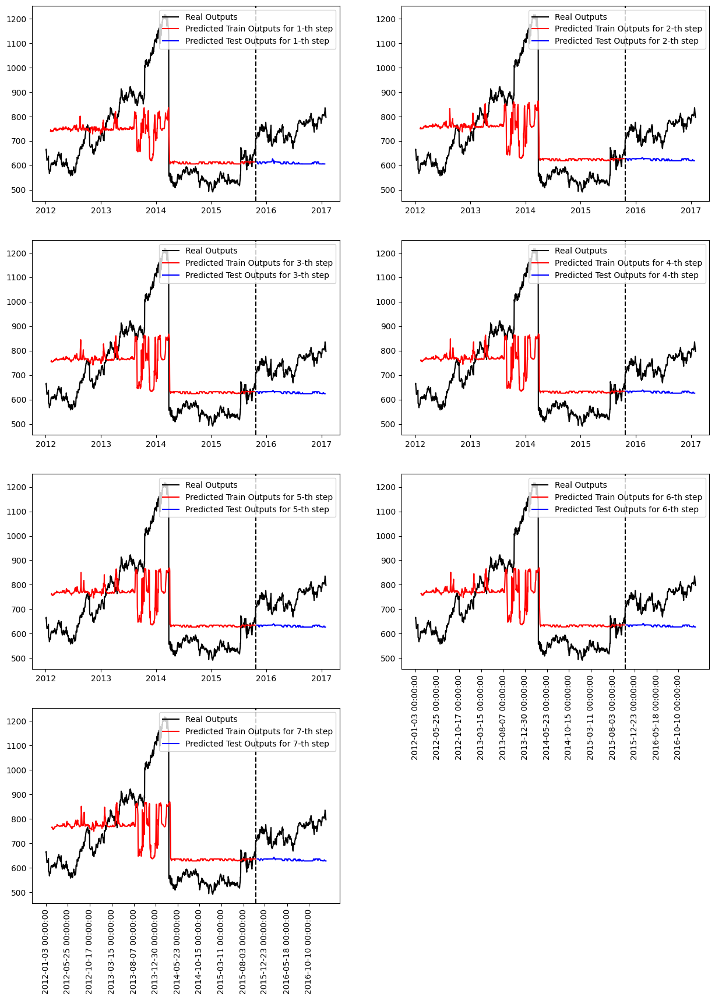

In [52]:
nnetwork = nnetwork_creator(dict_best_steps["Volume"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(nnetwork, optimizer,
                                                            scheduler, ["Volume"], dict_best_steps)

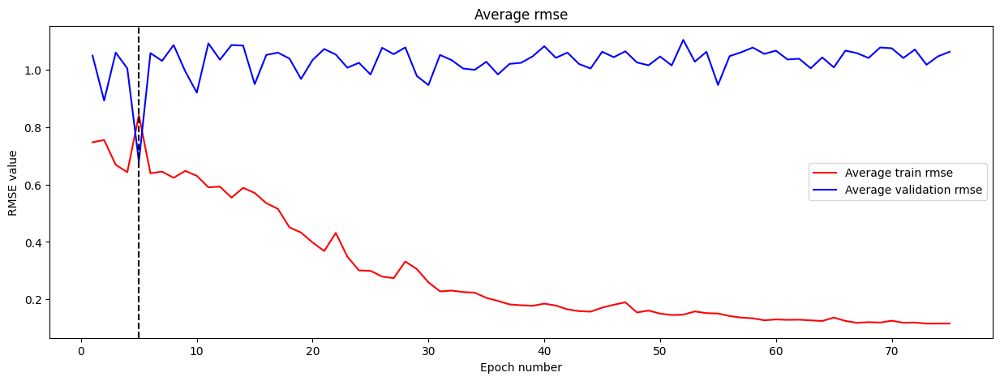

In [53]:
backprop_training.plot_metrics()

In [54]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Volume']}")

RMSE on the training set is: 157.56138436733158
RMSE on the testing set is: 125.52467620327685
RMSE for each of the 7 points on the testing set: [140.63055  127.435425 123.5024   122.06736  121.51212  121.21981
 121.10171 ]
Previous steps used: 21


### Using 'Close' variable for prediction (best result)

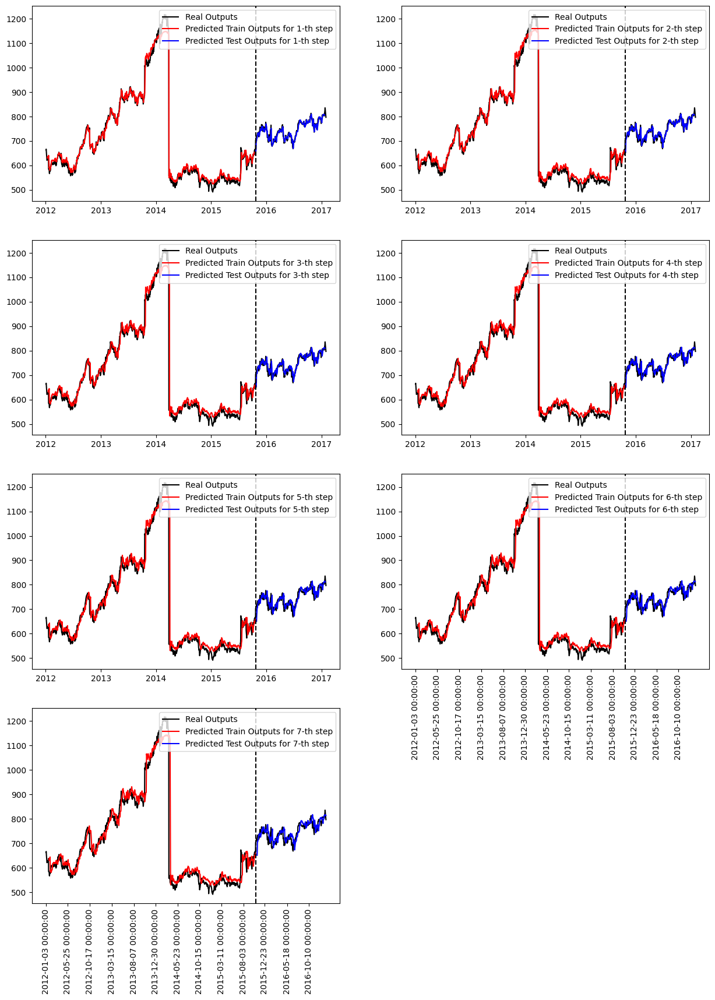

In [55]:
nnetwork = nnetwork_creator(dict_best_steps["Close"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(nnetwork, optimizer,
                                                            scheduler, ["Close"], dict_best_steps)

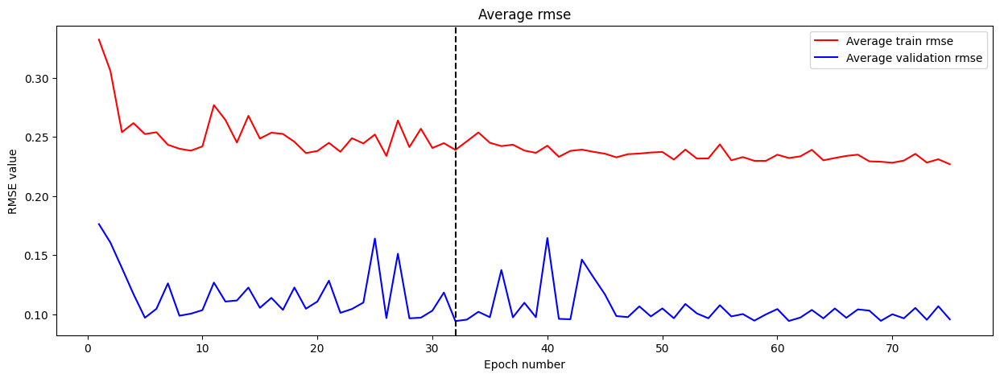

In [56]:
backprop_training.plot_metrics()

In [57]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Close']}")

RMSE on the training set is: 44.63914150273908
RMSE on the testing set is: 17.723153456905777
RMSE for each of the 7 points on the testing set: [10.7148695 13.6191845 16.269176  18.065908  19.493017  20.78051
 22.262291 ]
Previous steps used: 7


## Predictions using multi-layered univariate Conv1D-GRU Encoder-Decoder model

In [58]:
USED_TIMESTEPS_ARR = [14, 21, 28, 35] # larger amount of used steps
nnetwork_creator = lambda used_timesteps_quant: RNNEncoderDecoder(
                used_timesteps_quant,
                input_features_quant=1,
                rnn_type=nn.GRU,
                conv_dim="conv1d",
                conv_layers_quant=2, # several layers
                conv_out_features_quant=64,
                hidden_dim=35,
                out_seq_length=OUT_QUANT,
                rnn_num_layers=2,
                output_features_quant=1
        ).to(DEVICE)

dict_best_steps = {}
for used_variable in tqdm(["Close"]):
    best_average_rmse_test, best_prev_steps_used = BackpropTraining.find_best_model(
            used_timesteps_arr=USED_TIMESTEPS_ARR,
            train_data_norm=df_train_norm,
            test_data_norm=df_test_norm,
            train_data=df_train,
            test_data=df_test,
            nnetwork_creator=nnetwork_creator,
            epochs=75,
            used_feat=[used_variable],
            target_feat=TARGET_NAME
    )

    dict_best_steps[used_variable] = best_prev_steps_used

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

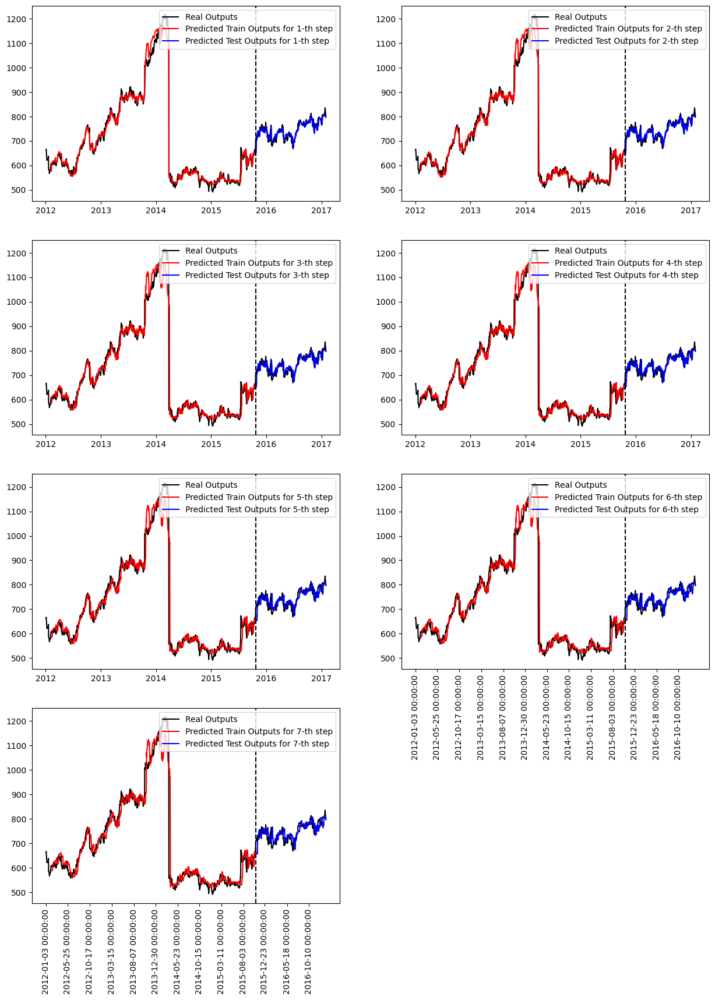

In [59]:
nnetwork = nnetwork_creator(dict_best_steps["Close"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Close"], dict_best_steps)

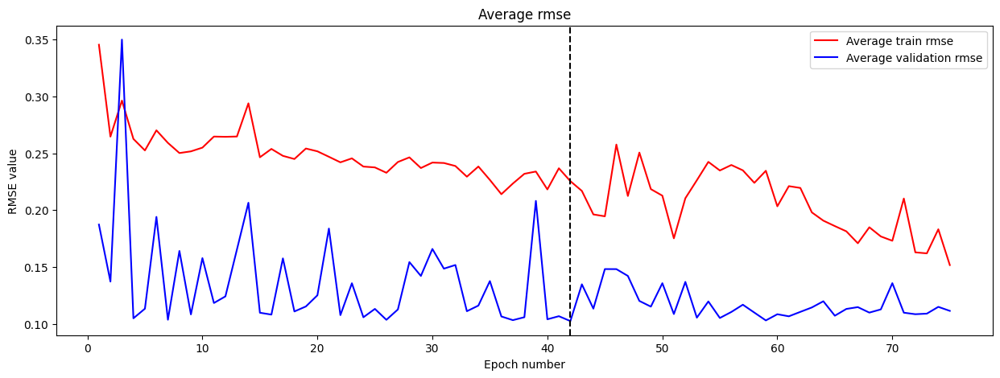

In [60]:
backprop_training.plot_metrics()

In [61]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Close']}")

RMSE on the training set is: 42.0695210870315
RMSE on the testing set is: 19.264425050070027
RMSE for each of the 7 points on the testing set: [13.730062 16.512718 18.211142 19.62334  20.650414 21.683754 22.875658]
Previous steps used: 21


## Predictions using multivariate Conv1D-LSTM Encoder-Decoder model

In [130]:
USED_TIMESTEPS_ARR = [14, 21, 28, 35]
# USED_TIMESTEPS_ARR = [14]
nnetwork_creator = lambda used_timesteps_quant: RNNEncoderDecoder(
                used_timesteps_quant,
                input_features_quant=len(ALL_VARIABLE_NAMES), # 5 input features
                rnn_type=nn.LSTM, # LSTM
                conv_dim="conv1d",
                conv_layers_quant=2,
                conv_out_features_quant=64,
                hidden_dim=35,
                out_seq_length=OUT_QUANT,
                rnn_num_layers=2,
                output_features_quant=1
        ).to(DEVICE)

best_average_rmse_test, best_prev_steps_used = BackpropTraining.find_best_model(
        used_timesteps_arr=USED_TIMESTEPS_ARR,
        train_data_norm=df_train_norm,
        test_data_norm=df_test_norm,
        train_data=df_train,
        test_data=df_test,
        nnetwork_creator=nnetwork_creator,
        epochs=90,
        used_feat=ALL_VARIABLE_NAMES, # all 5 var. used as an input
        target_feat=TARGET_NAME
)

  0%|          | 0/4 [00:00<?, ?it/s]

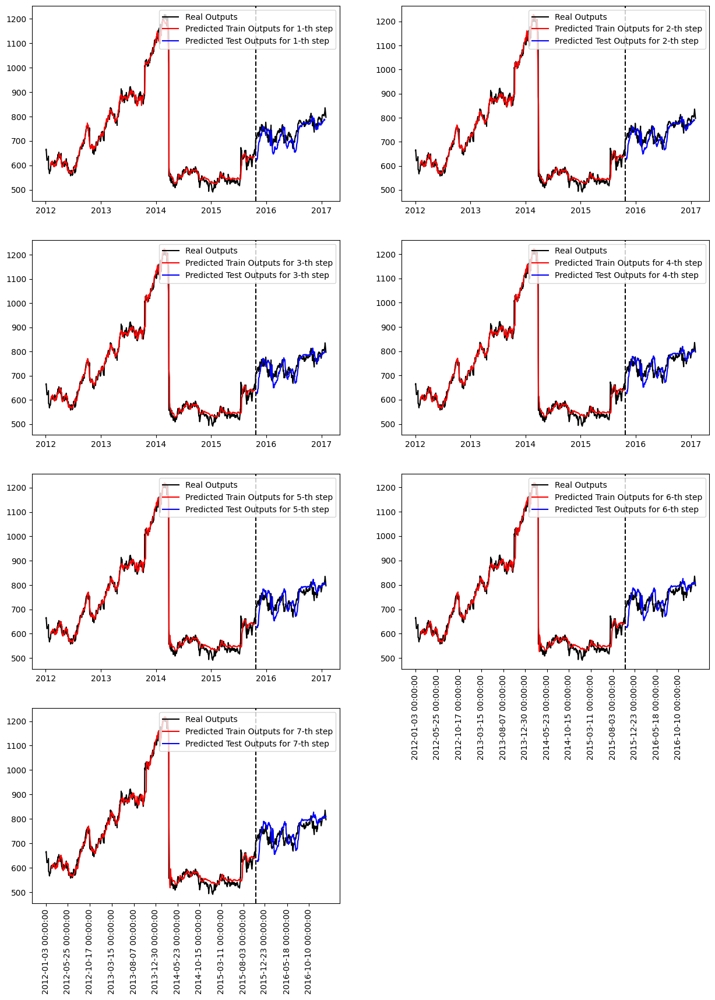

In [131]:
nnetwork = nnetwork_creator(best_prev_steps_used)
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ALL_VARIABLE_NAMES,
    {"_".join(ALL_VARIABLE_NAMES): best_prev_steps_used})

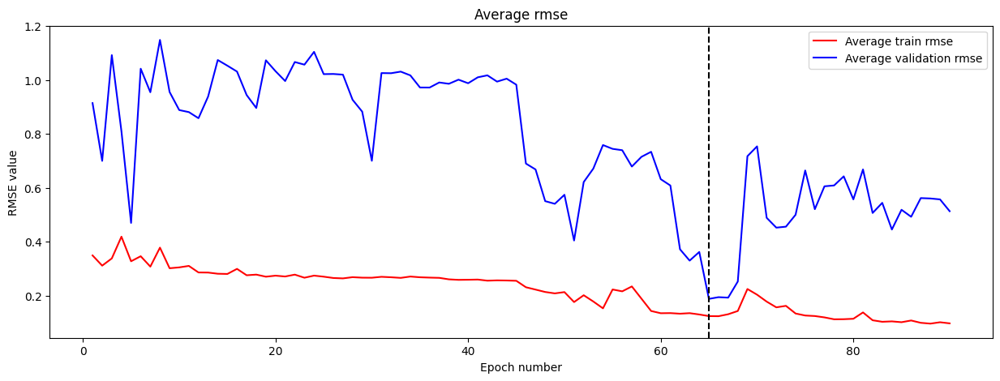

In [132]:
backprop_training.plot_metrics()

In [133]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {best_prev_steps_used}")

RMSE on the training set is: 23.145456534774272
RMSE on the testing set is: 35.34856254536297
RMSE for each of the 7 points on the testing set: [34.542435 32.244553 32.96341  34.437485 36.104515 37.646145 38.993084]
Previous steps used: 21


## Predictions using multivariate Conv1D-GRU Encoder-Decoder model
### - multi-layered decoder

In [99]:
USED_TIMESTEPS_ARR = [14, 21, 28, 35]
# USED_TIMESTEPS_ARR = [14]
nnetwork_creator = lambda used_timesteps_quant: RNNEncoderDecoder(
                used_timesteps_quant,
                input_features_quant=len(ALL_VARIABLE_NAMES), # 5 input features
                rnn_type=nn.GRU, # GRU
                conv_dim="conv1d",
                conv_layers_quant=2,
                conv_out_features_quant=64,
                hidden_dim=35,
                out_seq_length=OUT_QUANT,
                rnn_num_layers=2,
                output_features_quant=1
        ).to(DEVICE)

best_average_rmse_test, best_prev_steps_used = BackpropTraining.find_best_model(
        used_timesteps_arr=USED_TIMESTEPS_ARR,
        train_data_norm=df_train_norm,
        test_data_norm=df_test_norm,
        train_data=df_train,
        test_data=df_test,
        nnetwork_creator=nnetwork_creator,
        epochs=60,
        used_feat=ALL_VARIABLE_NAMES, # all 5 var. used as an input
        target_feat=TARGET_NAME
)

  0%|          | 0/4 [00:00<?, ?it/s]

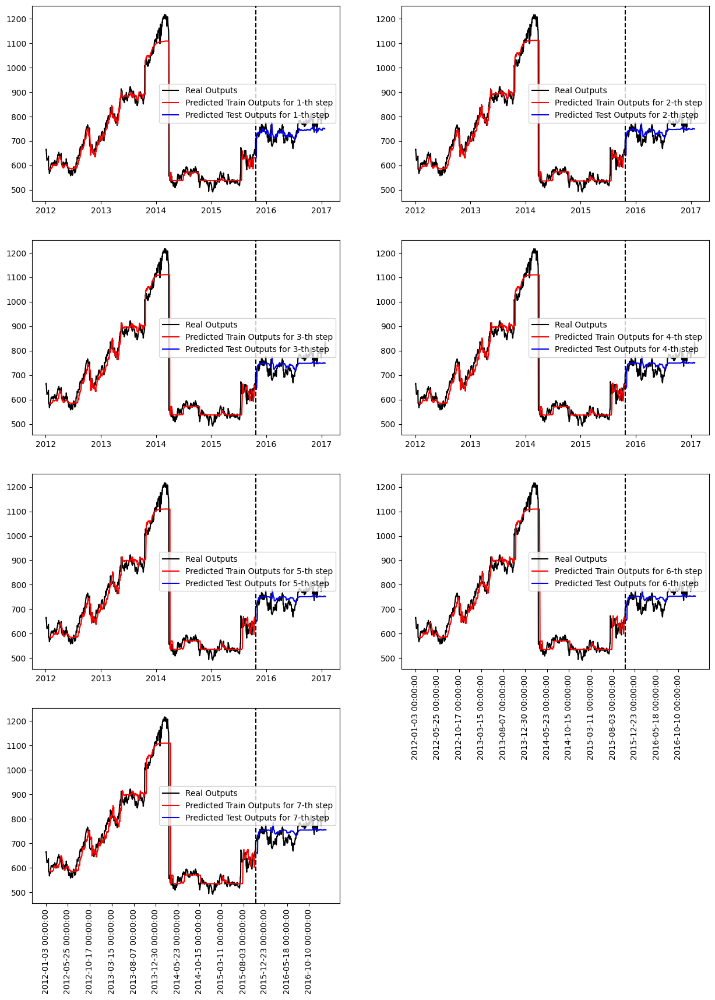

In [100]:
nnetwork = nnetwork_creator(best_prev_steps_used)
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ALL_VARIABLE_NAMES,
    {"_".join(ALL_VARIABLE_NAMES): best_prev_steps_used})

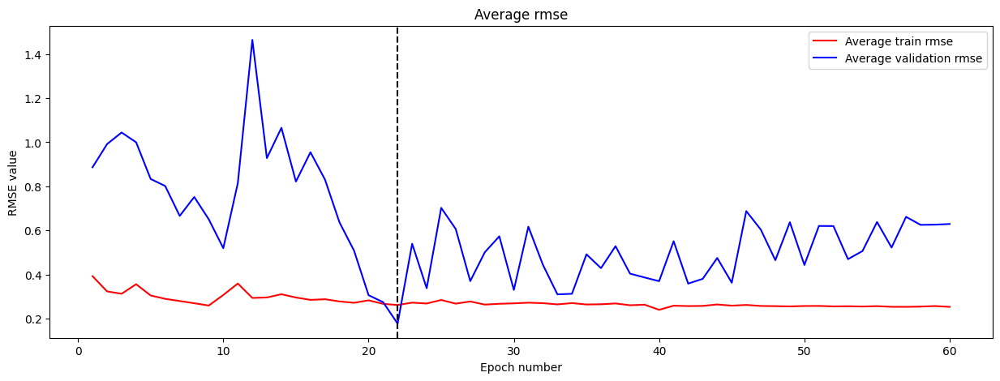

In [101]:
backprop_training.plot_metrics()

In [102]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {best_prev_steps_used}")

RMSE on the training set is: 50.153012940712244
RMSE on the testing set is: 32.41760137496681
RMSE for each of the 7 points on the testing set: [30.011454 30.855253 32.088356 32.84886  33.34195  33.650723 33.923546]
Previous steps used: 14


### - single-layered decoder (best result)

In [134]:
USED_TIMESTEPS_ARR = [14, 21, 28, 35]
# USED_TIMESTEPS_ARR = [14]
nnetwork_creator = lambda used_timesteps_quant: RNNEncoderDecoder(
                used_timesteps_quant,
                input_features_quant=len(ALL_VARIABLE_NAMES), # 5 input features
                rnn_type=nn.GRU, # GRU
                conv_dim="conv1d",
                conv_layers_quant=2,
                conv_out_features_quant=64,
                hidden_dim=50,
                out_seq_length=OUT_QUANT,
                rnn_num_layers=1,
                output_features_quant=1
        ).to(DEVICE)

best_average_rmse_test, best_prev_steps_used = BackpropTraining.find_best_model(
        used_timesteps_arr=USED_TIMESTEPS_ARR,
        train_data_norm=df_train_norm,
        test_data_norm=df_test_norm,
        train_data=df_train,
        test_data=df_test,
        nnetwork_creator=nnetwork_creator,
        epochs=60,
        used_feat=ALL_VARIABLE_NAMES, # all 5 var. used as an input
        target_feat=TARGET_NAME
)

  0%|          | 0/4 [00:00<?, ?it/s]

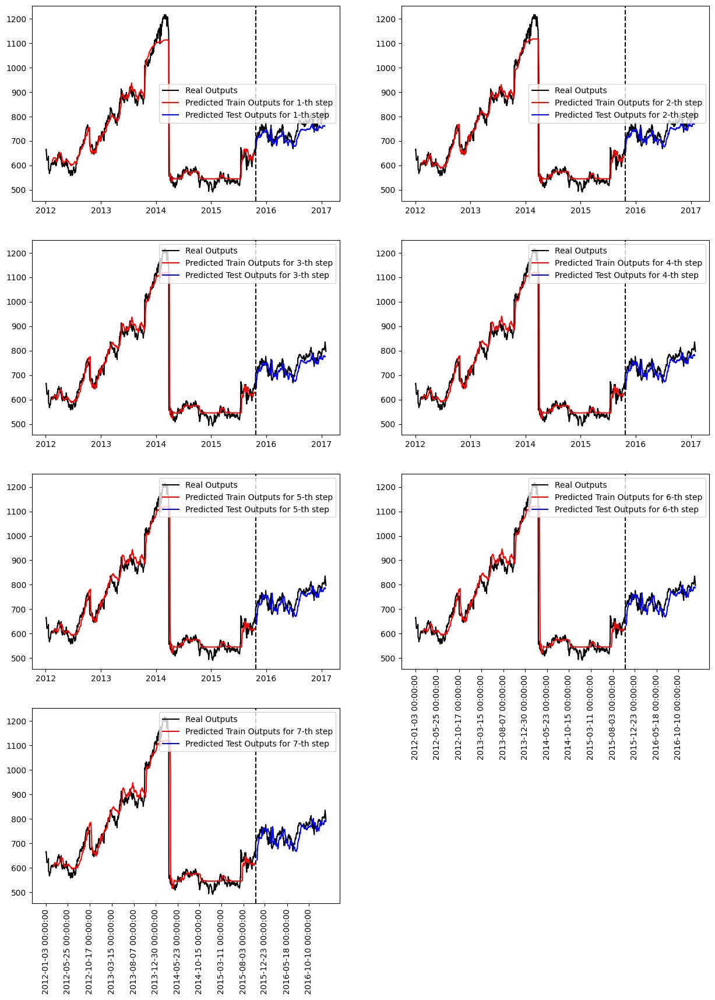

In [135]:
nnetwork = nnetwork_creator(best_prev_steps_used)
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ALL_VARIABLE_NAMES,
    {"_".join(ALL_VARIABLE_NAMES): best_prev_steps_used})

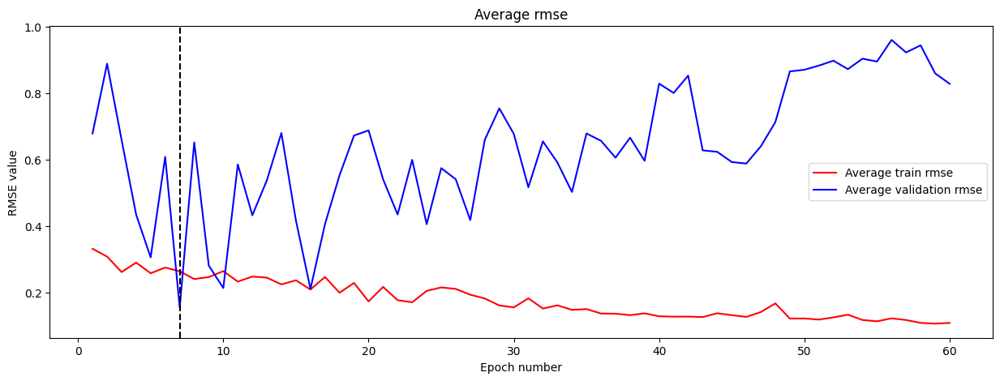

In [137]:
backprop_training.plot_metrics()

In [136]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {best_prev_steps_used}")

RMSE on the training set is: 49.129348368299674
RMSE on the testing set is: 28.773576440405787
RMSE for each of the 7 points on the testing set: [28.50976  27.206474 27.670095 28.221212 29.014847 29.828115 30.80233 ]
Previous steps used: 28


## Predictions using univariate ConvLSTM2D-LSTM Encoder-Decoder model

In [103]:
USED_TIMESTEPS_ARR = [7, 14, 21, 28]
nnetwork_creator = lambda used_timesteps_quant: RNNEncoderDecoder(
                used_timesteps_quant,
                input_features_quant=1,
                rnn_type=nn.LSTM,
                conv_dim="lstm_conv", # ConvLSTM2D-LSTM
                conv_layers_quant=1,
                conv_out_features_quant=64,
                hidden_dim=35,
                out_seq_length=OUT_QUANT,
                rnn_num_layers=2,
                output_features_quant=1
        ).to(DEVICE)

dict_best_steps = {}
for used_variable in tqdm(ALL_VARIABLE_NAMES):
    best_average_rmse_test, best_prev_steps_used = BackpropTraining.find_best_model(
            used_timesteps_arr=USED_TIMESTEPS_ARR,
            train_data_norm=df_train_norm,
            test_data_norm=df_test_norm,
            train_data=df_train,
            test_data=df_test,
            nnetwork_creator=nnetwork_creator,
            epochs=75,
            used_feat=[used_variable],
            target_feat=TARGET_NAME
    )

    dict_best_steps[used_variable] = best_prev_steps_used

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

### Using 'Open' variable for prediction

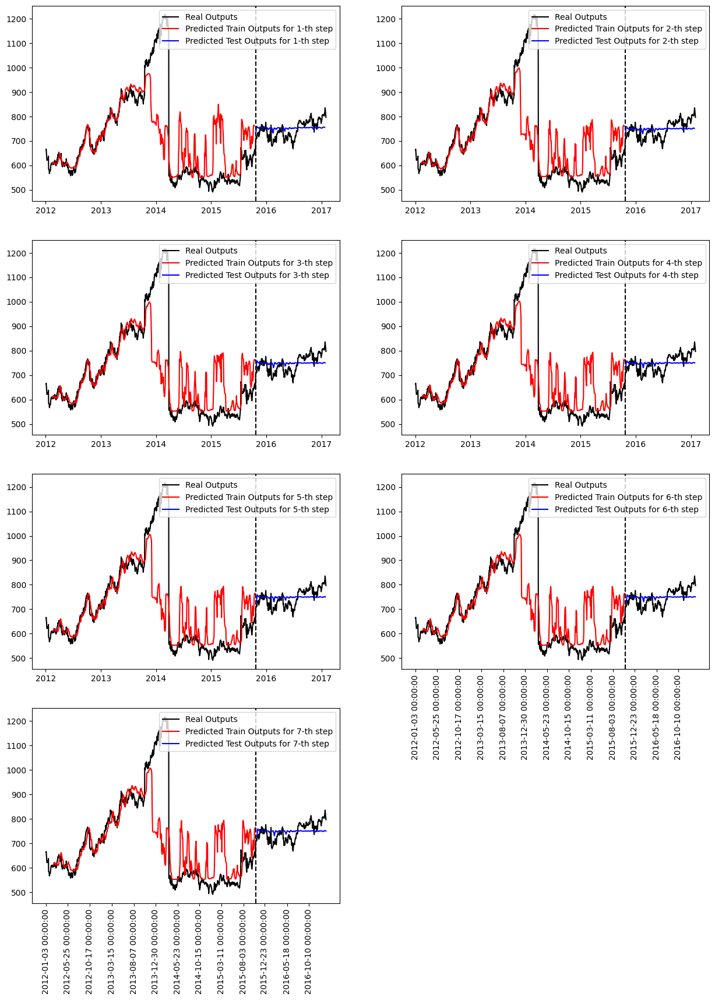

In [104]:
nnetwork = nnetwork_creator(dict_best_steps["Open"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Open"], dict_best_steps)

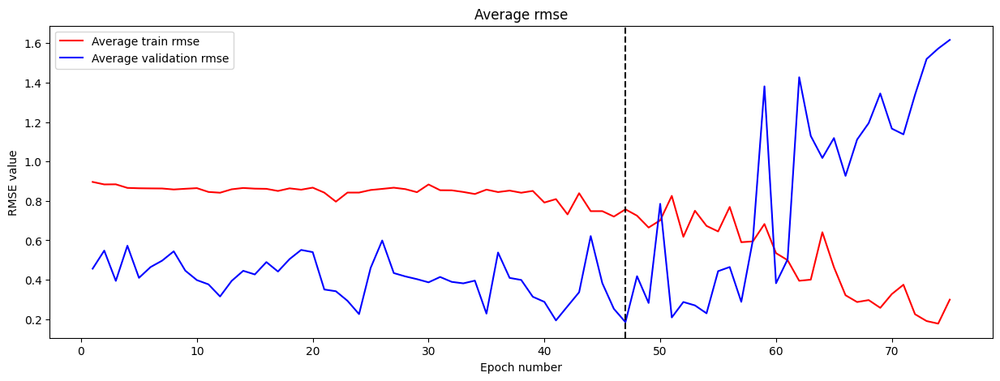

In [105]:
backprop_training.plot_metrics()

In [106]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Open']}")

RMSE on the training set is: 141.71297879649202
RMSE on the testing set is: 33.83153309910648
RMSE for each of the 7 points on the testing set: [33.076088 33.116463 33.61241  33.972576 34.225533 34.344574 34.444363]
Previous steps used: 28


### Using 'Low' variable for prediction

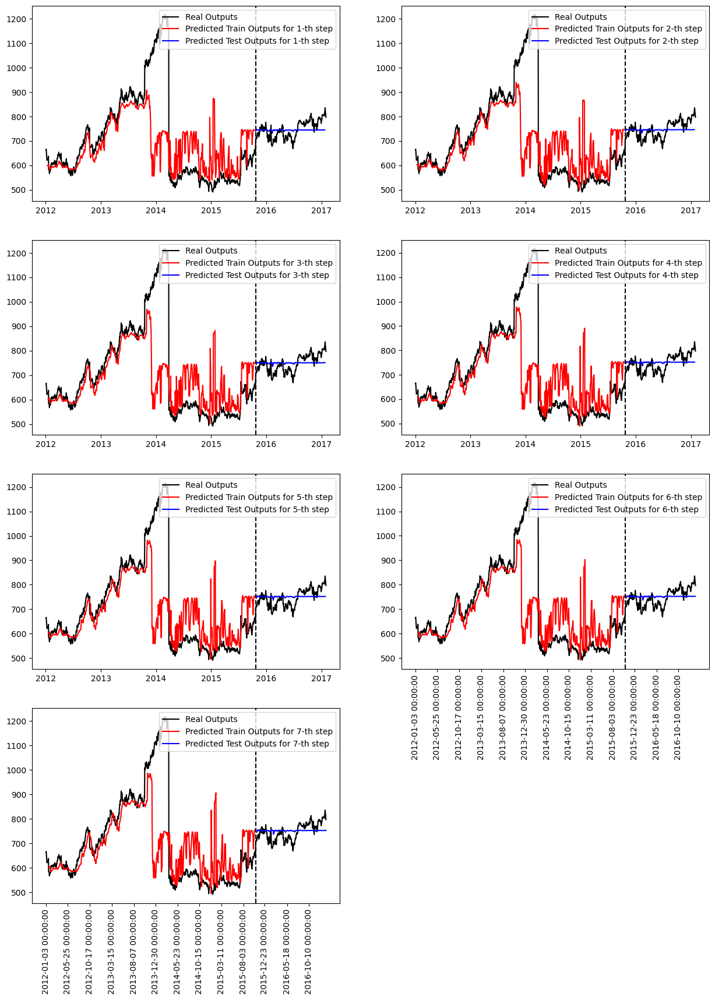

In [107]:
nnetwork = nnetwork_creator(dict_best_steps["Low"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Low"], dict_best_steps)

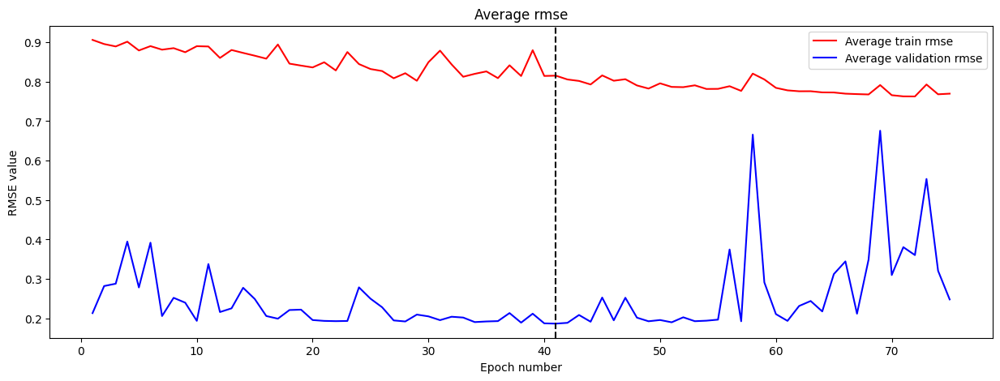

In [108]:
backprop_training.plot_metrics()

In [109]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Low']}")

RMSE on the training set is: 152.2286263732942
RMSE on the testing set is: 34.15060280397697
RMSE for each of the 7 points on the testing set: [33.294544 33.4885   33.930183 34.301758 34.56356  34.686134 34.759254]
Previous steps used: 7


### Using 'High' variable for prediction

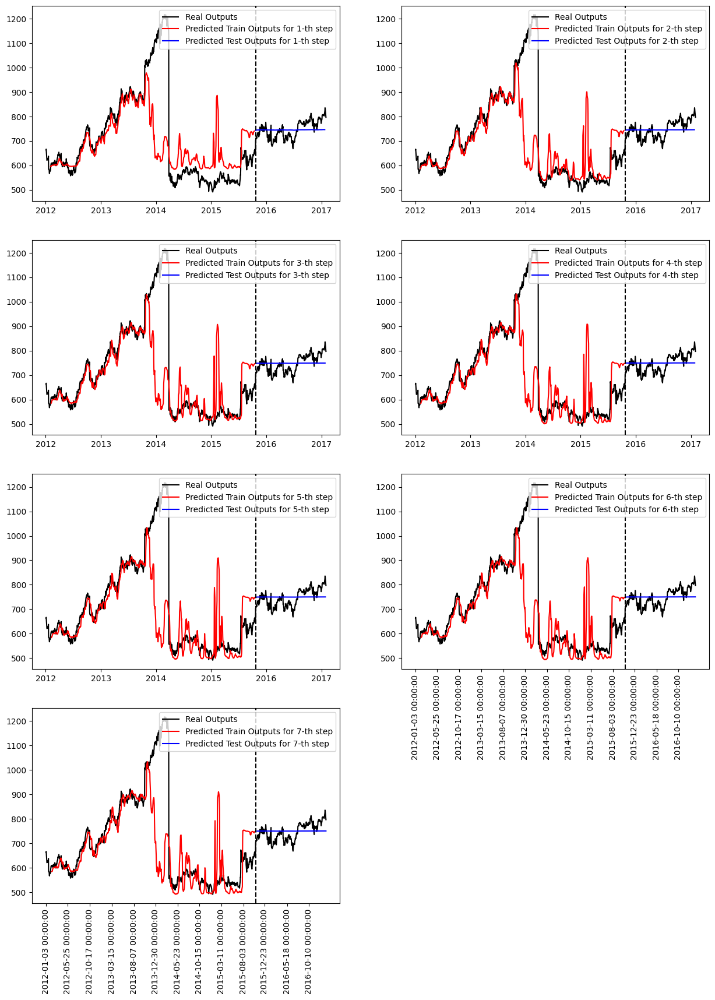

In [110]:
nnetwork = nnetwork_creator(dict_best_steps["High"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["High"], dict_best_steps)

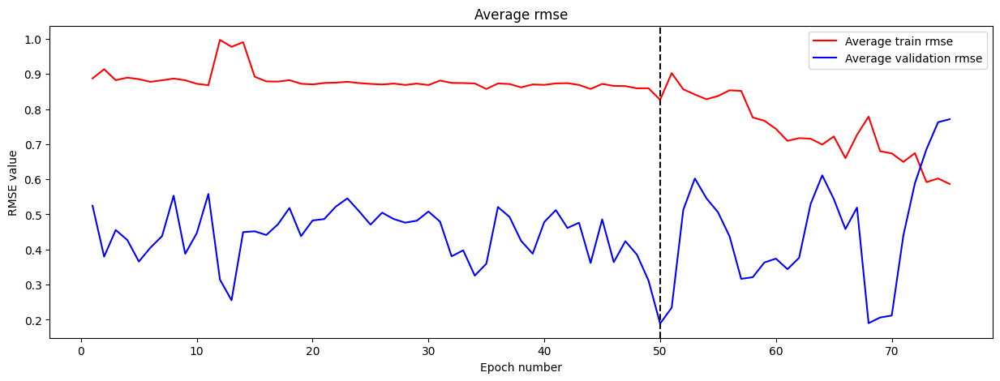

In [111]:
backprop_training.plot_metrics()

In [112]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['High']}")

RMSE on the training set is: 154.20905807944615
RMSE on the testing set is: 34.48259793790014
RMSE for each of the 7 points on the testing set: [33.473713 33.891586 34.337467 34.673622 34.90875  35.00856  35.052494]
Previous steps used: 21


### Using 'Volume' variable for prediction

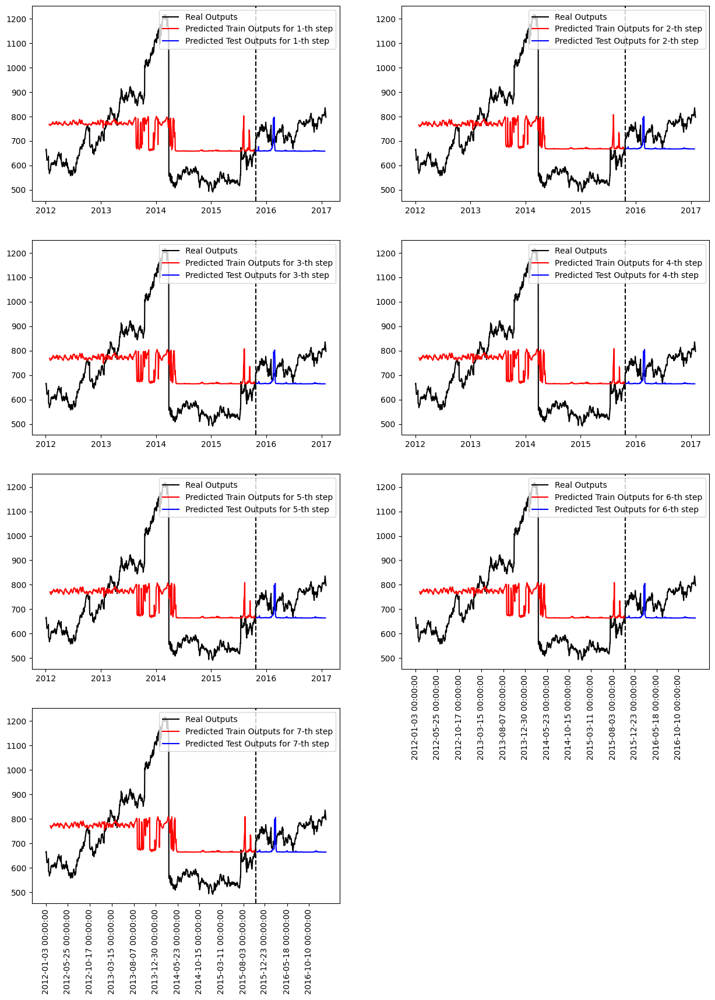

In [113]:
nnetwork = nnetwork_creator(dict_best_steps["Volume"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Volume"], dict_best_steps)

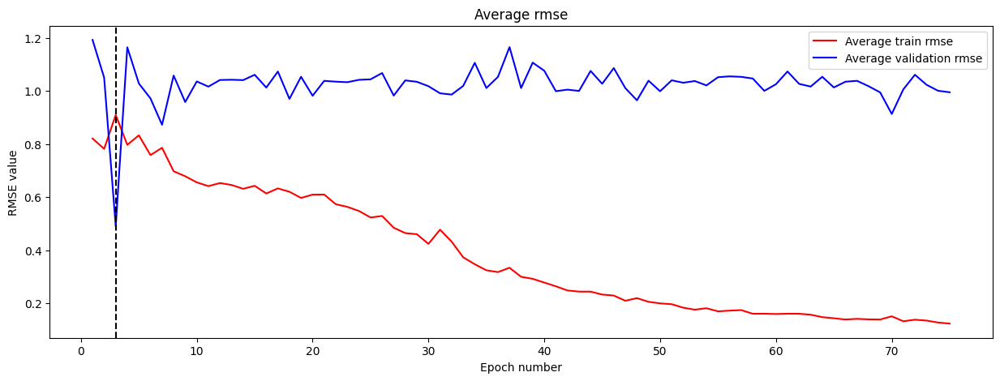

In [114]:
backprop_training.plot_metrics()

In [115]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Volume']}")

RMSE on the training set is: 170.13259420045003
RMSE on the testing set is: 90.08758216834049
RMSE for each of the 7 points on the testing set: [93.81418  86.04407  89.3137   89.675476 90.28041  90.53153  90.777725]
Previous steps used: 14


### Using 'Close' variable for prediction (best result)

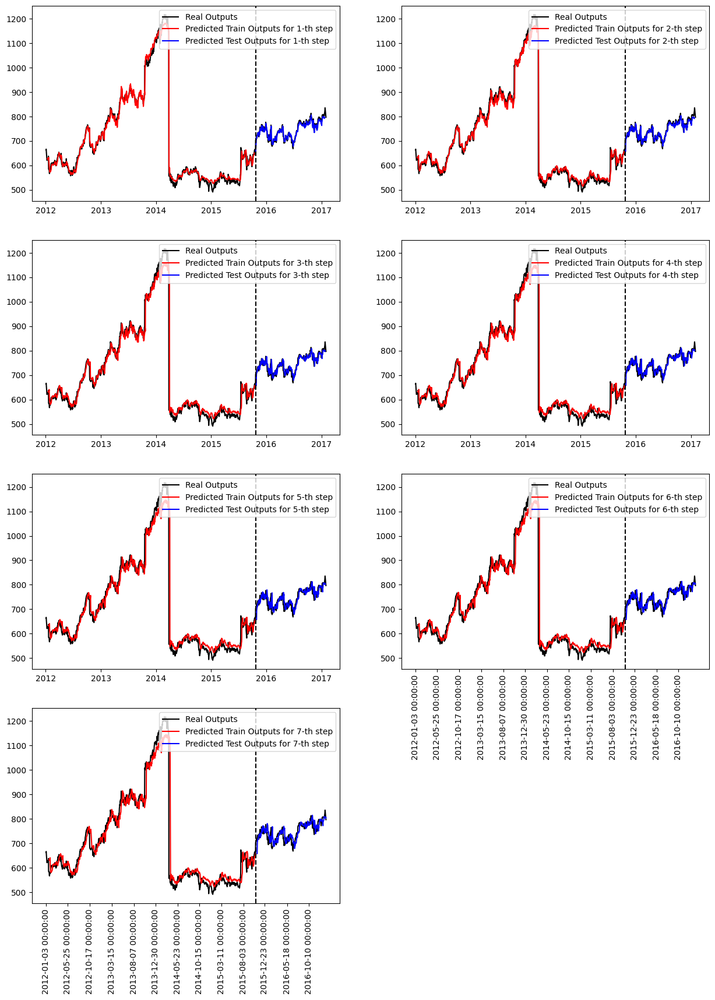

In [116]:
nnetwork = nnetwork_creator(dict_best_steps["Close"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Close"], dict_best_steps)

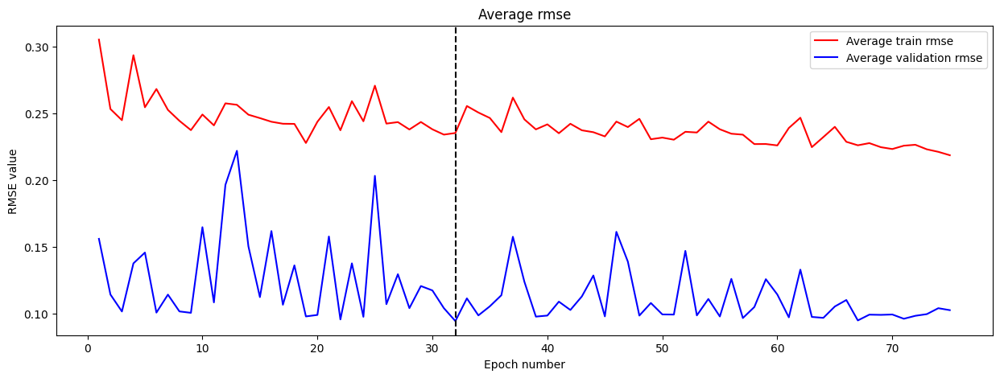

In [117]:
backprop_training.plot_metrics()

In [118]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Close']}")

RMSE on the training set is: 43.88913283997888
RMSE on the testing set is: 17.624715166969278
RMSE for each of the 7 points on the testing set: [10.5463085 13.540339  15.900965  17.911581  19.538862  20.805494
 22.170868 ]
Previous steps used: 7


## Predictions using univariate multi-layered ConvLSTM2D-LSTM Encoder-Decoder model

In [119]:
USED_TIMESTEPS_ARR = [14, 21, 28, 35] # larger amount of used steps
nnetwork_creator = lambda used_timesteps_quant: RNNEncoderDecoder(
                used_timesteps_quant,
                input_features_quant=1,
                rnn_type=nn.LSTM,
                conv_dim="lstm_conv", # ConvLSTM2D-LSTM
                conv_layers_quant=2, # several layers
                conv_out_features_quant=64,
                hidden_dim=35,
                out_seq_length=OUT_QUANT,
                rnn_num_layers=2,
                output_features_quant=1
        ).to(DEVICE)

dict_best_steps = {}
for used_variable in tqdm(["Close"]):
    best_average_rmse_test, best_prev_steps_used = BackpropTraining.find_best_model(
            used_timesteps_arr=USED_TIMESTEPS_ARR,
            train_data_norm=df_train_norm,
            test_data_norm=df_test_norm,
            train_data=df_train,
            test_data=df_test,
            nnetwork_creator=nnetwork_creator,
            epochs=75,
            used_feat=[used_variable],
            target_feat=TARGET_NAME
    )

    dict_best_steps[used_variable] = best_prev_steps_used

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

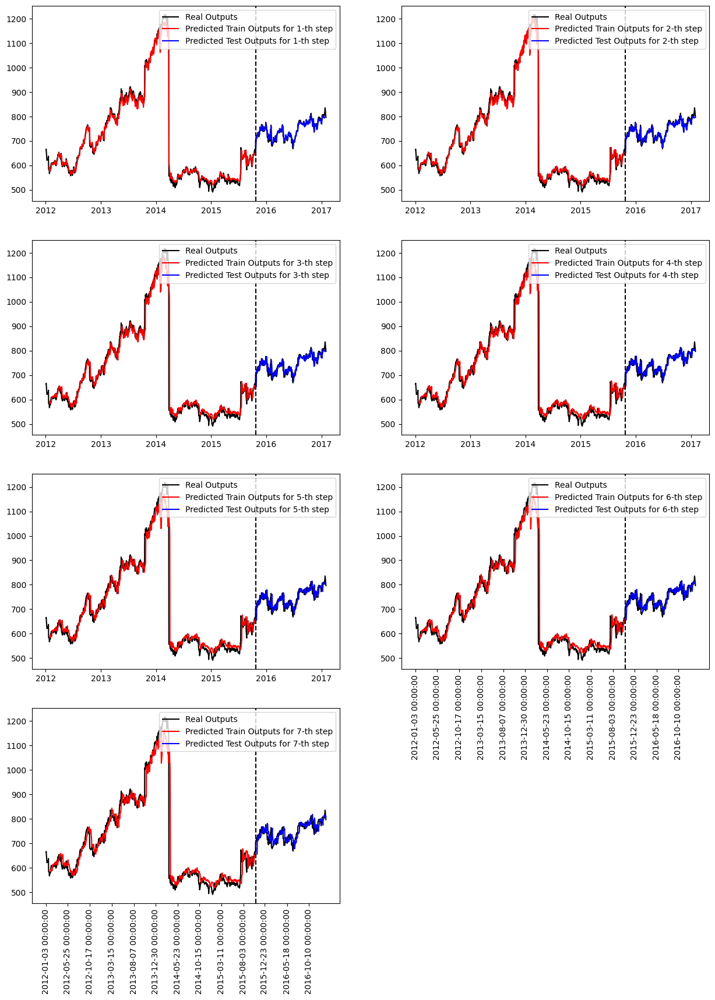

In [120]:
nnetwork = nnetwork_creator(dict_best_steps["Close"])
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ["Close"], dict_best_steps)

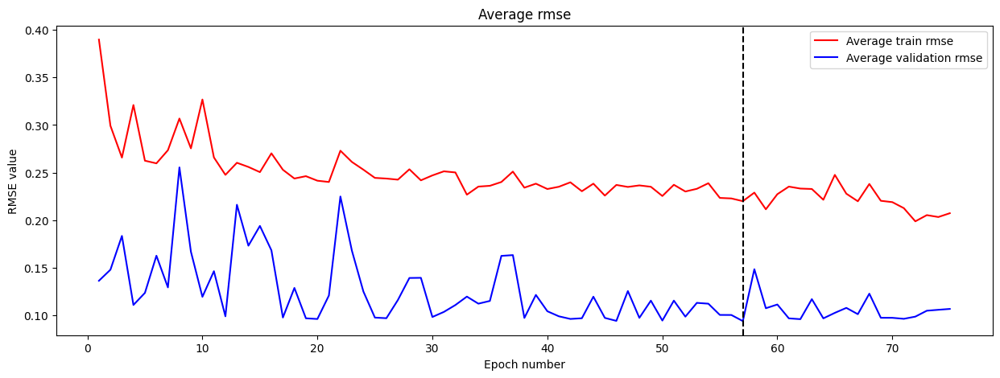

In [121]:
backprop_training.plot_metrics()

In [122]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {dict_best_steps['Close']}")

RMSE on the training set is: 40.96185314516346
RMSE on the testing set is: 17.600158933442103
RMSE for each of the 7 points on the testing set: [10.110258 13.540883 16.065662 17.99396  19.507452 20.741798 22.139002]
Previous steps used: 14


## Predictions using multivariate ConvLSTM2D-LSTM Encoder-Decoder model

In [123]:
USED_TIMESTEPS_ARR = [7, 14, 21, 28]
# USED_TIMESTEPS_ARR = [14]
nnetwork_creator = lambda used_timesteps_quant: RNNEncoderDecoder(
                used_timesteps_quant,
                input_features_quant=len(ALL_VARIABLE_NAMES), # 5 input features
                rnn_type=nn.LSTM,
                conv_dim="lstm_conv", # ConvLSTM2D-LSTM
                conv_layers_quant=2,
                conv_out_features_quant=64,
                hidden_dim=35,
                out_seq_length=OUT_QUANT,
                rnn_num_layers=2,
                output_features_quant=1
        ).to(DEVICE)

best_average_rmse_test, best_prev_steps_used = BackpropTraining.find_best_model(
        used_timesteps_arr=USED_TIMESTEPS_ARR,
        train_data_norm=df_train_norm,
        test_data_norm=df_test_norm,
        train_data=df_train,
        test_data=df_test,
        nnetwork_creator=nnetwork_creator,
        epochs=80,
        used_feat=ALL_VARIABLE_NAMES, # all 5 var. used as an input
        target_feat=TARGET_NAME
)

  0%|          | 0/4 [00:00<?, ?it/s]

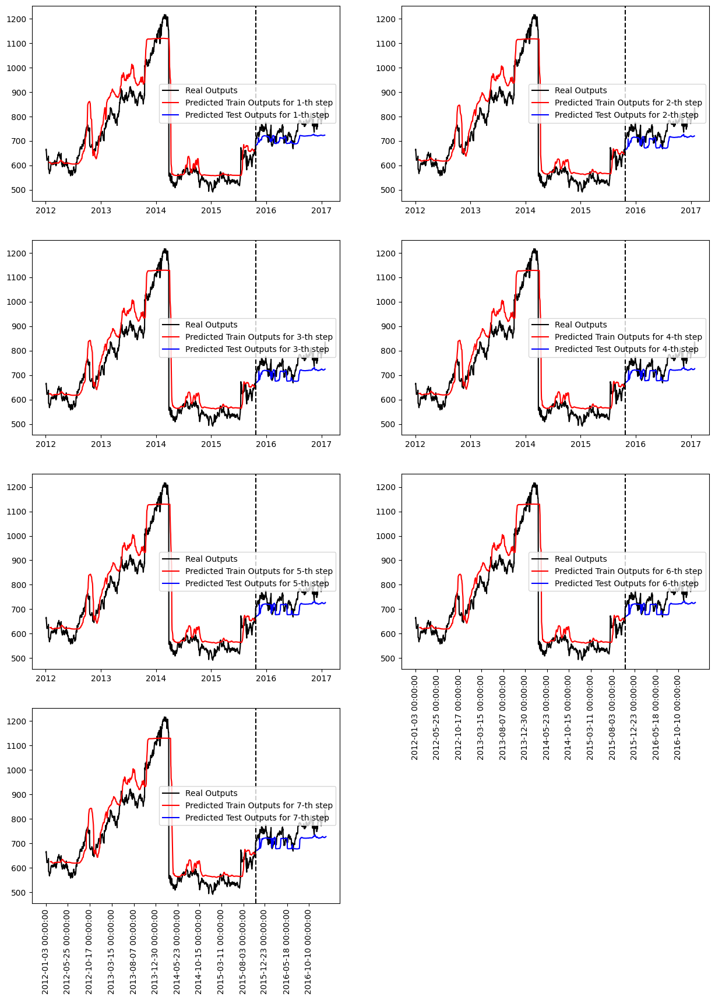

In [124]:
nnetwork = nnetwork_creator(best_prev_steps_used)
optimizer = GLOBAL_OPTIMIZER(nnetwork.parameters())
scheduler = GLOBAL_SCHEDULER(optimizer)
(rmse_train, rmse_test, rmse_test_vec), backprop_training = load_and_plot(
    nnetwork, optimizer, scheduler, ALL_VARIABLE_NAMES,
    {"_".join(ALL_VARIABLE_NAMES): best_prev_steps_used})

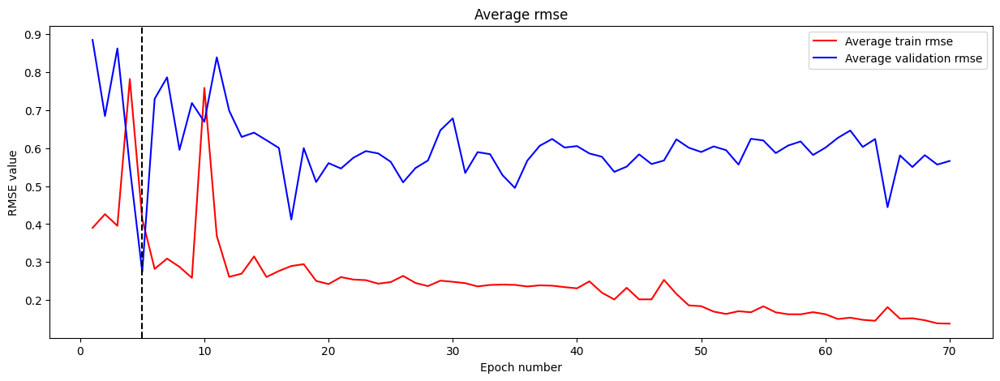

In [125]:
backprop_training.plot_metrics()

In [126]:
print(f"RMSE on the training set is: {rmse_train}")
print(f"RMSE on the testing set is: {rmse_test}")
print(f"RMSE for each of the 7 points on the testing set: {rmse_test_vec}")
print(f"Previous steps used: {best_prev_steps_used}")

RMSE on the training set is: 76.93635762758723
RMSE on the testing set is: 50.16227816188799
RMSE for each of the 7 points on the testing set: [45.41394  53.390686 50.802643 50.08282  50.08039  50.297184 50.732033]
Previous steps used: 14


# Conclusions

| Method                            | Previous steps used | Used var. | Train RMSE | Test RMSE | RMSE on pt.1 | pt.2  | pt.3  | pt.4  | pt.5  | pt.6  | pt.7  |
|-----------------------------------|---------------------|-----------|------------|-----------|--------------|-------|-------|-------|-------|-------|-------|
| Laboratory work 3             | - | - | - | - | - | - | - | - | - | - | - |
| Univariate LSTM model             | 7                   | "Close"   | 43.058     | 17.557    | 9.57         | 12.97 | 15.96 | 17.97 | 19.58 | 20.89 | 22.38 |
| Univariate GRU model              |  28                   | "Close"    |   48.25   |  17.427   |  9.74 | 13 | 15.81 |17.87 | 19.27 | 20.79 | 22.11  |
| Univariate LSTM Encoder-Decoder   |     14           |   "Close" |    44.463   |   17.545  |  9.52 | 12.98 | 16.02 | 18.09 | 19.65 | 20.85 | 22.16  |
| Univariate GRU Encoder-Decoder    |     14          |  "Close"  |   45.034  |    17.54  |   9.77 |  13.02 | 15.93 | 18.03 | 19.61 | 20.83 | 22.16  |
| Smoothed LSTM Encoder             |       7       |  "Close"  |    84.533   |  19.108   |   10.07 | 13.61 | 16.56 | 18.6 | 22.93 | 21.18 | 25.97  |
| Smoothed GRU Encoder              |      28     |  "Close"   |    85.278  |   21.456 | 11.52 | 15.75 | 19.55 | 20.56 | 22.37 | 26.57 | 28.82  |
| Multivariate LSTM Encoder-Decoder |      14    |     All      |    41.92   |   40.416  |  34.82 | 33.46 | 38.71 | 41.92 | 43.52 | 44.18 | 44.72 |
| Multivariate GRU Encoder-Decoder  |      7      |     All      |  45.265   |  18.547  |    16.14 | 13.13 | 15.79 | 18.11 | 19.95 |  21.57 | 23.12  |
| Laboratory work 4             | - | - | - | - | - | - | - | - | - | - | - |
| Univariate Conv1D-LSTM Encoder-Decoder | 7                   | "Close"   | 43.243     | 17.771    | 10.963 | 13.751 | 16.204 | 18.086 | 19.531 | 20.861 | 22.253 |
| Univariate multi-layered Conv1D-LSTM Encoder-Decoder | 21                   | "Close"   | 45.356    | 18.336    | 13.215 | 15.382 | 17.118 | 18.575 | 19.764 | 20.78 | 21.95 |
| Univariate Conv1D-GRU Encoder-Decoder | 7                   | "Close"   | 44.639     | 17.723   | 10.715 | 13.619 | 16.269 | 18.066 | 19.493 | 20.781 | 22.262 |
| Univariate multi-layered Conv1D-GRU Encoder-Decoder | 21                   | "Close"   | 42.07     | 19.264    | 13.73 | 16.513 | 18.211 | 19.623 | 20.65 | 21.684 | 22.876 |
| Multivariate Conv1D-LSTM Encoder-Decoder | 21                   | All   | 23.145 | 35.349    | 34.542 | 32.245 | 32.963 | 34.437 | 36.105 | 37.646 | 38.993 |
| Multivariate Conv1D-GRU Encoder-Decoder | 28                   | All   | 49.129  | 28.774    | 28.51 | 27.206 | 27.67 | 28.221 | 29.015 | 29.828 | 30.802 |
| Univariate ConvLSTM2D-LSTM Encoder-Decoder | 7                   | "Close"   | 43.889     | 17.625    | 10.546 | 13.54 | 15.9 | 17.912 | 19.539 | 20.805 | 22.171 |
| Univariate multi-layered ConvLSTM2D-LSTM Encoder-Decoder | 14                   | "Close"   | 40.962     | 17.6    | 10.11 | 13.541 | 16.066 | 17.994 | 19.507 | 20.742 | 22.139 |
| Multivariate ConvLSTM2D-LSTM Encoder-Decoder | 14                   | All   | 76.936     | 50.162    | 45.414 | 53.391 | 50.803 | 50.083 | 50.08 | 50.297 | 50.732 |

As we can see, in this laboratory work Univariate multi-layered ConvLSTM2D-LSTM Encoder-Decoder that is utilizing "Close" variable provided the best result on the test set, and the Multivariate ConvLSTM2D-LSTM Encoder-Decoder provided the worst result (by the way it is also the worst among methods from lab. 3 too). However, Univariate GRU model that is utilizing "Close" variable still provides the best results on the test set among the two laboratory works. Judging by the vector of RMSE of 7 future predicted points we can see that RMSE grows from left to right, meaning that the complexity of the prediction is higher for the more distant points, which is expected, since it is more difficult to predict further into the future. Interestingly, though Univariate multi-layered Conv1D-LSTM Encoder-Decoder doesn't provide the best average RMSE for test set, it provides the best RMSE among two laboratory works for the furthest (7-th) predicted point. As we can see in all cases utilizing all variables as an input makes the model less stable and more prone to overfitting. However, it is worth noting, that GRU-based multivariate models perform better than LSTM-based.